<a href="https://colab.research.google.com/github/mkorob/NovelAnalysis/blob/main/GoneWithTheWind_Lemmatized_PROCESS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gone With The Wind Character Analysis

Summary of what this notebook does to insert later.


## 0. Preliminaries

In [1]:
import requests
import pandas as pd
import nltk
from nltk import pos_tag, ne_chunk
from nltk.tokenize import word_tokenize
import re
from bs4 import BeautifulSoup

In [2]:
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('punkt')
nltk.download('words')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

## 1. Load Gone With The Wind Text from Gutenberg


In [ ]:
# URL of "Gone with the Wind" on Project Gutenberg
url = "https://gutenberg.net.au/ebooks02/0200161.txt"

# Send a GET request to the URL
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200:
    # Extract the content of the book
    content = response.text

    # Remove Project Gutenberg's header and footer
    start_index = content.find("CHAPTER I")
    end_index = content.find("THE END")
    content = content[start_index:end_index]

    # Display the first 500 characters of the content
    print(content[:500])
else:
    print("Failed to retrieve the book from Project Gutenberg.")

CHAPTER I


Scarlett O'Hara was not beautiful, but men seldom realized it when
caught by her charm as the Tarleton twins were.  In her face were
too sharply blended the delicate features of her mother, a Coast
aristocrat of French descent, and the heavy ones of her florid
Irish father.  But it was an arresting face, pointed of chin,
square of jaw.  Her eyes were pale green without a touch of hazel,
starred with bristly black lashes and slightly tilted at the ends.
Above them, her thick black bro


In [ ]:
#check the start and the end of the novel
print(f"The Start of the GTTW : {content[:100]}")
print(f"The End of the GTTW : {content[-100:]}")

The Start of the GTTW : CHAPTER I


Scarlett O'Hara was not beautiful, but men seldom realized it when
caught by her charm a
The End of the GTTW : it then.
Tomorrow, I'll think of some way to get him back.  After all,
tomorrow is another day."






## 2. Extract Main Characters

To analyze interactions, we need to map the named entities in the text to the names of the main characters. Here, we make a list of all characters in the novel the way they are referred to in a novel and map them to a unique list of characters in the novel. (e.g. "Catherine", "Cathy", -> "Catherine").

In [ ]:
import spacy

In [ ]:
def extract_characters(text):
    nlp = spacy.load("en_core_web_sm")
    doc = nlp(text)
    named_entities = set()
    for ent in doc.ents:
        if ent.label_ in ["PERSON"]:
            named_entities.add(ent.text)

    return sorted(named_entities)

In [ ]:
len(content)

2340566

In [ ]:
#Spacy NER's extractor needs shorter texts so we split in thirds
thir_content = int(len(content)/3)
characters1 = extract_characters(content[:thir_content])
characters2 = extract_characters(content[thir_content:(thir_content*2)])
characters3 = extract_characters(content[(thir_content*2):])

In [ ]:
characters = set(characters1) | set(characters2) | set(characters3)

In [ ]:
characters = [c for c in list(characters) if c[0].isupper()]

In [ ]:
len(characters)

778

In [ ]:
characters = sorted(characters)

In [ ]:
#remove any characters that are subsets of one another (e.g. no need for Charles and Charles Hamilton)
unique_characters = set()
for name in characters:
    if not any(f"{n.strip()} " in name.strip() or f"{n.strip()}\n" in name.strip() for n in unique_characters):
        unique_characters.add(name)

In [ ]:
len(unique_characters)

535

In [ ]:
#export the dataframe to CSV and manually match characters
pd.DataFrame(characters).to_csv("possible_characters.csv")

In [ ]:
#export the dataframe to CSV and manually match characters
pd.DataFrame(unique_characters).to_csv("possible_reduced_characters_v2.csv")

In [ ]:
#import the completed list
characters = pd.read_excel("/content/possible_reduced_characters_v2 (1).xlsx")

In [ ]:
#this is old output, the new one should have two columns, one for name as in book, the second for the "real name"
characters = characters[['character', 'character_real']].loc[characters['character_real'] != "remove", :].reset_index(drop = True)

In [ ]:
characters

,character,character_real
0,Rosa,Rosa
1,Watling,Watling
2,Kill Ashley,Ashley
3,Darcy,Darcy
4,Ulster,Ulster
...,...,...
221,Sadie Belle,Belle
222,Wynder,Wynder
223,Rene,Rene
224,Pork,Pork


In [ ]:
characters['character_real'].unique()

array(['Rosa', 'Watling', 'Ashley', 'Darcy', 'Ulster', 'Scarlett',
       'Bonnie', 'Jeff\nDavis', 'Mammy', 'Merriwether', 'Jack', 'Munroe',
       'Fontaine', 'Pauline', 'Dan Tucker', 'Buck Munroe', 'Rhett',
       'Mick', 'Pharisees', 'Poke', 'Pitty', 'Sam', 'Suellen', 'Bullock',
       'Prissy', 'Susan Elinor', 'Sarah Jane', 'Phillip', 'Melanie',
       'Nathan Bedford Forrest', 'Frank', 'Robillard', 'Will', 'Bub',
       'McRae', 'Johnson', 'Tarleton', 'Henry', 'Burdens', 'Paul Wilson',
       'Doc Fontaine', 'Charles', 'Andy Bonnell', 'Betsy', 'Carreen',
       'Brown', 'Morgan', 'Wade', 'Calverts', 'Emmie', 'Jonas', 'Betty',
       'Archie', 'Cathleen', 'Jane', 'Jerry', 'Dilcey', 'Brenton',
       'Hilton', 'Tom', 'Alex', 'Jim', 'Sylvia', 'Beau', 'Hetty Tarleton',
       'Suzannah Talbot', 'Elsing', 'Lou', 'Boyne', 'Calhoun',
       'Dolly Merriwether', 'Meade', 'John', 'Stuart', 'Caroline Irene',
       'Jeb Stuart', 'Gerald', 'Hugh', 'Melissy', 'Bonnell', 'Wilkerson',
       'T

## 3. Split Text into Narrative and Dialogue

In [ ]:
def split_text(text):

    sections = []

    inside_quote = False
    start_index = 0
    end_index = 0
    current_quote_type = "Narrative"
    count_quotations =0

    for i, char in enumerate(text):
        if char == '"' and count_quotations == 0:
            if not inside_quote and text[i+1].isupper():
                #append existing text
                sections.append({ 'text': text[start_index:i].strip(), 'type': "Narrative"})
                #start end
                inside_quote = True
                start_index = i
                current_quote_type = 'Dialogue'
                count_quotations = 1
        elif char == '"' and count_quotations == 1:
            if inside_quote:
                inside_quote = False
                end_index = i
                #append existing text
                sections.append({ 'text': text[start_index:end_index+1].strip(), 'type': "Dialogue"})
                start_index = i +1
                count_quotations = 0
    return sections

In [ ]:
#split text into sections
def split_text_into_sections(text):
    sections = []

    for line in text.split('\r\n\r\n'):
        line = line.strip()
        if line:
          if '"' in line:
            sections = sections + split_text(line)
          else:
            sections.append({'text': line, 'type': 'Narrative'})

    df = pd.DataFrame(sections)
    return df

In [ ]:
result_df = split_text_into_sections(content)
#filter out empty sections (paragraphs spaces)
result_df = result_df.loc[result_df['text'] != "", ]

In [ ]:
result_df

,text,type
0,CHAPTER I\n\n\nScarlett O'Hara was not beautif...,Narrative
1,"""I know you two don't care about being expelle...",Dialogue
2,she said.,Narrative
3,"""But what about Boyd? He's kind of set on get...",Dialogue
5,"""Oh, he can read law in Judge Parmalee's offic...",Dialogue
...,...,...
13005,"""I won't think of it now,""",Dialogue
13006,"she said again, aloud, trying to push\nher mis...",Narrative
13007,"""I'll--why, I'll go home to Tara\ntomorrow,""",Dialogue
13008,and her spirits lifted faintly.\n\nShe had gon...,Narrative


In [ ]:
#export df to check for any issues
result_df.to_csv("content_df.csv")

In [3]:
result_df = pd.read_csv("/content/content_df (1).csv")

In [ ]:
result_df.head(n = 50)

,text,type
0,CHAPTER I\n\n\nScarlett O'Hara was not beautif...,Narrative
1,"""I know you two don't care about being expelle...",Dialogue
2,she said.,Narrative
3,"""But what about Boyd? He's kind of set on get...",Dialogue
5,"""Oh, he can read law in Judge Parmalee's offic...",Dialogue
6,answered Brent carelessly.,Narrative
7,"""Besides, it don't\nmatter much. We'd have ha...",Dialogue
9,"""Why?""",Dialogue
11,"""The war, goose! The war's going to start any...",Dialogue
13,"""You know there isn't going to be any war,""",Dialogue


##4. Match Entities between Dialogue Sections

In [ ]:
def match_entities(text, text_type, characters):
    if text_type == "Narrative":
        ent_out = []
        for index, row in characters.iterrows():
            entity = row['character']
            matches = re.finditer(re.escape(entity), text)
            for match in matches:
                ent_out.append((match.start(), match.end(), row['character_real']))
        ent_out.sort(key=lambda x: x[0])
        #return all characters unless they were just mentioned before
        return [ent_out[i][2] for i in range(len(ent_out)) if i == 0 or ent_out[i][2] != ent_out[i - 1][2]]

    else:
        return None


result_df['Entities'] = result_df.apply(lambda row: match_entities(row['text'], row['type'], characters), axis=1)

In [ ]:
result_df.head(n=50)

,text,type,Entities
0,CHAPTER I\n\n\nScarlett O'Hara was not beautif...,Narrative,"[Scarlett, Tarleton, Stuart, Brent, Tarleton, ..."
1,"""I know you two don't care about being expelle...",Dialogue,None
2,she said.,Narrative,[]
3,"""But what about Boyd? He's kind of set on get...",Dialogue,None
5,"""Oh, he can read law in Judge Parmalee's offic...",Dialogue,None
6,answered Brent carelessly.,Narrative,[Brent]
7,"""Besides, it don't\nmatter much. We'd have ha...",Dialogue,None
9,"""Why?""",Dialogue,None
11,"""The war, goose! The war's going to start any...",Dialogue,None
13,"""You know there isn't going to be any war,""",Dialogue,None


In [ ]:
convo_df =  pd.DataFrame(data = {
        'Character1': [],
        'Character2': [],
        'StartIndex': [],
        'EndIndex': [],
        'text_out': []
    })

convo_characters = []
convo_start = None
convo_end = None
text_out = ""
for idx, row in result_df.iterrows():
  if row['type'] == "Dialogue":
    convo_end = idx
    text_out += row['text']
    if convo_start is None:
      convo_start = idx

  else:
    if row['type'] == "Narrative":
      for entity in row['Entities']:
        if entity not in convo_characters and convo_characters is not None:
            convo_characters.append(entity)
        if len(convo_characters) > 2:
            new_row = pd.DataFrame(data= {'Character1': convo_characters[0], 'Character2': convo_characters[1], 'StartIndex': convo_start, 'EndIndex': convo_end, 'text_out': text_out}, index=[0])
            convo_df = pd.concat([convo_df, new_row])
            convo_characters = [convo_characters[-1]]
            convo_start = None
            text_out = ""

In [ ]:
convo_df = convo_df.dropna()

In [ ]:
def merge_characters(char1, char2):
  list_out = "_".join(sorted([char1, char2]))
  return str(list_out)

In [ ]:
convo_df['characters'] = convo_df.apply(lambda row: merge_characters(row['Character1'], row['Character2']), axis=1)

In [ ]:
convo_df['character_count'] = convo_df['text_out'].apply(len)

In [ ]:
convo_df

,Character1,Character2,StartIndex,EndIndex,text_out,characters,character_count
0,Scarlett,Brent,1,19,"""I know you two don't care about being expelle...",Brent_Scarlett,1015
0,Stuart,Scarlett,21,27,"""The Yankees may be scared of us, but after th...",Scarlett_Stuart,971
0,Tom,Fontaine,29,33,"""Didn't she say anything when you got home las...",Fontaine_Tom,1302
0,Beatrice,Tarleton,35,35,"""Of course she won't hit Boyd. She never did ...",Beatrice_Tarleton,126
0,Stuart,Scarlett,37,49,"""That's why we left him\nat home to explain th...",Scarlett_Stuart,714
...,...,...,...,...,...,...,...
0,Ashley,Scarlett,12887,12897,"""But love can't wear out!""""Yours for Ashley di...",Ashley_Scarlett,1702
0,Rhett,Belle,12899,12911,"""It was so obvious that we were meant for each...",Belle_Rhett,2113
0,Ashley,Rhett,12913,12947,"""But then, there was Bonnie and I saw that eve...",Ashley_Rhett,2358
0,Gerald,Rhett,12949,12971,"""Don't be a fool, Rhett! I can make--""""Don't ...",Gerald_Rhett,1676


In [6]:
convo_df_main = pd.read_csv("/content/whole_convos.csv")

<Axes: xlabel='characters'>

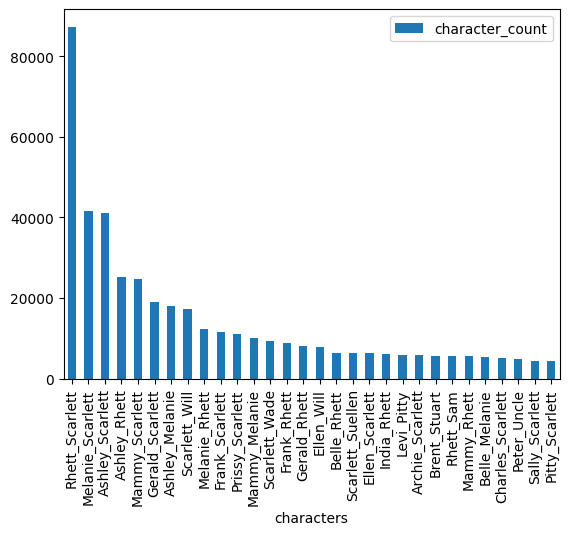

In [ ]:
convo_df.groupby(['characters']).agg({'character_count': 'sum'}).sort_values(by='character_count', ascending=False).head(n=30).plot(kind = "bar")

In [ ]:
main_interactions  = ["Rhett_Scarlett", "Ashley_Scarlett", "Melanie_Scarlett", "Gerald_Scarlett"]

In [ ]:
main_characters = ["Scarlett", "Rhett", "Ashley", "Gerald", "Melanie"]

In [ ]:
convo_df_main = convo_df.loc[convo_df['characters'].isin(main_interactions), :].reset_index(drop = True)

<Axes: xlabel='characters'>

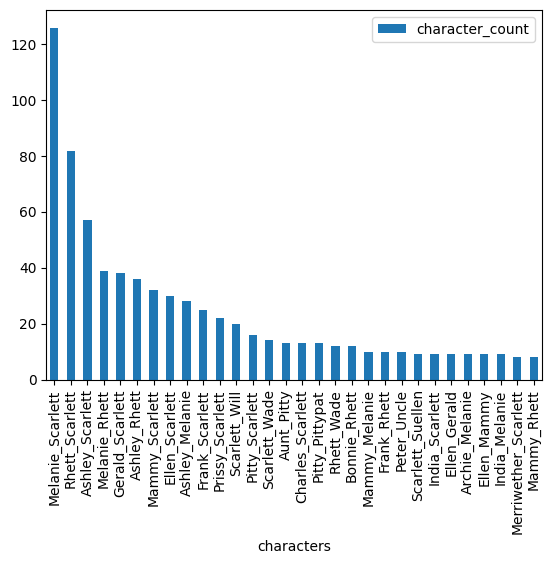

In [ ]:
convo_df.groupby(['characters']).agg({'character_count': 'count'}).sort_values(by='character_count', ascending=False).head(n=30).plot(kind = "bar")

## 5. Pre-process Text for Regressions and LDA


### 5.1 Clean text from stopwords and other irrelevant words

In [106]:
" ".join(convo_df_main['text_out'][convo_df_main['characters']== "Ashley_Scarlett"].tolist())

'"Why, Ashley hasn\'t an idea that I\'m in love with him!""How could he know?  I\'ve always acted so prissy and ladylike and\ntouch-me-not around him he probably thinks I don\'t care a thing\nabout him except as a friend.  Yes, that\'s why he\'s never spoken!\nHe thinks his love is hopeless.  And that\'s why he\'s looked so--""He\'s been broken hearted because he thinks I\'m in love with Brent\nor Stuart or Cade.  And probably he thinks that if he can\'t have\nme, he might as well please his family and marry Melanie.  But if\nhe knew I did love him--""Oh!""What a fool I\'ve been not to think of this till\nnow!  I must think of some way to let him know.  He wouldn\'t marry\nher if he knew I loved him!  How could he?" "I\'ll remember how beautiful this day is till I die,""Perhaps it will be my wedding day!" "If I can just live through this barbecue till this afternoon,""Of course, he has to be\nattentive to Melanie because, after all, she is his cousin and she\nisn\'t popular at all, and

In [108]:
from nltk.tokenize import sent_tokenize, word_tokenize

In [185]:
def chunk_text(text, min_tokens=20, max_tokens=50):
    sentences = sent_tokenize(text)
    chunks = []
    current_chunk = []
    current_chunk_length = 0

    for sentence in sentences:
        sentence_tokens = word_tokenize(sentence)
        sentence_length = len(sentence_tokens)

        # Check if adding the current sentence would exceed the max token limit
        if current_chunk_length + sentence_length > max_tokens:
            # If the current chunk has enough tokens, finalize it and start a new chunk
            if current_chunk_length >= min_tokens:
                chunks.append(' '.join(current_chunk))
                current_chunk = sentence_tokens
                current_chunk_length = sentence_length
            else:
                # If the current chunk doesn't have enough tokens, keep adding sentences until it does
                current_chunk.extend(sentence_tokens)
                current_chunk_length += sentence_length
        else:
            # Add the sentence to the current chunk
            current_chunk.extend(sentence_tokens)
            current_chunk_length += sentence_length

    # Add the last chunk if it has any sentences
    if current_chunk:
        chunks.append(' '.join(current_chunk))

    return chunks

# Example usage:
text = "Your text goes here. It can have multiple sentences. The function will chunk this text properly."

chunks_LR_Ashley = chunk_text(" ".join(convo_df_main['text_out'][convo_df_main['characters']== "Ashley_Scarlett"].tolist()), min_tokens = 20, max_tokens = 40)
chunks_TM_Ashley = chunk_text(" ".join(convo_df_main['text_out_wo_verbs'][convo_df_main['characters']== "Ashley_Scarlett"].tolist()), min_tokens = 40, max_tokens = 100)

In [186]:
chunks_LR_Gerald = chunk_text(" ".join(convo_df_main['text_out'][convo_df_main['characters']== "Gerald_Scarlett"].tolist()), min_tokens = 20, max_tokens = 40)
chunks_TM_Gerald = chunk_text(" ".join(convo_df_main['text_out_wo_verbs'][convo_df_main['characters']== "Gerald_Scarlett"].tolist()), min_tokens = 40, max_tokens = 100)

In [187]:
chunks_LR_Rhett = chunk_text(" ".join(convo_df_main['text_out'][convo_df_main['characters']== "Rhett_Scarlett"].tolist()), min_tokens = 20, max_tokens = 40)
chunks_TM_Rhett = chunk_text(" ".join(convo_df_main['text_out_wo_verbs'][convo_df_main['characters']== "Rhett_Scarlett"].tolist()), min_tokens = 40, max_tokens = 100)

In [188]:
# Assuming convo_df_main is your DataFrame and 'text_out' is the column containing text
# Apply the remove_stopwords function to the 'text_out' column
processed_LR_Ashley = [remove_stopwords(chunk) for chunk in chunks_LR_Ashley]
processed_TM_Ashley = [remove_stopwords(chunk) for chunk in chunks_TM_Ashley]

In [189]:
processed_LR_Rhett = [remove_stopwords(chunk) for chunk in chunks_LR_Rhett]
processed_TM_Rhett = [remove_stopwords(chunk) for chunk in chunks_TM_Rhett]

In [190]:
processed_LR_Gerald = [remove_stopwords(chunk) for chunk in chunks_LR_Gerald]
processed_TM_Gerald= [remove_stopwords(chunk) for chunk in chunks_TM_Gerald]

In [194]:
chunks_LR_Melanie = chunk_text(" ".join(convo_df_main['text_out'][convo_df_main['characters']== "Melanie_Scarlett"].tolist()), min_tokens = 20, max_tokens = 40)
chunks_TM_Melanie = chunk_text(" ".join(convo_df_main['text_out_wo_verbs'][convo_df_main['characters']== "Melanie_Scarlett"].tolist()), min_tokens = 40, max_tokens = 100)

In [195]:
processed_LR_Melanie = [remove_stopwords(chunk) for chunk in chunks_LR_Melanie]
processed_TM_Melanie= [remove_stopwords(chunk) for chunk in chunks_TM_Melanie]

In [196]:
processed_TM_Ashley

['ley idea love could always y ladylike around probably thing except friend yes never love hopeless hearted love   art cade',
 'probably might well please family   fool till must way would could tiful day till wedding day',
 'barbecue till afternoon course attentive   cousin popular wallflower hot headed war misery world war war one ever',
 'baby house good time jine cavalry dear wife dixie   mad silly porch something   gentleman georgia troop well along without georgian',
 'perhaps old march mrs   kindly   well mount nothing   something could never home mrs    last horse mother father girl well love father nearly today pa pa',
 'war course far stiff knee away mother able pare fence would lot rough ride army father easy would horse fence dead head father',
 'wonder neck right well   three time mrs o hara   bed take mother wee word beast ear active service   need shame someone must home crops army',
 '  honey macon burrs mr o hara twelve oak well must dear pretty face must kiss pat    w

In [9]:
import pandas as pd

# Load the Excel file into a pandas DataFrame
df = pd.read_excel('possible_reduced_characters_v2 (1).xlsx', header=None)

# Filter the DataFrame to exclude rows where the third column contains "remove"
filtered_df = df[df.iloc[:, 2] != 'remove']

# Extract unique character names from the first column
character_names_all = filtered_df.iloc[:, 1].unique()

row_to_remove = 0
if row_to_remove < len(character_names_all):
    character_names_all = list(character_names_all)
    character_names_all.pop(row_to_remove)

# Print the extracted character names
print(character_names_all)

['Rosa', 'Watling', 'Kill Ashley', 'Darcy', 'Ulster', 'Scarlert', 'Eugenie Victoria', 'Jeff\nDavis', 'Tell Mammy', 'Merriwether', 'Jack', 'Munroe', 'Scarlett', 'Mama Fontaine', 'Pauline', 'Dan Tucker', 'Unless Ashley', 'Buck Munroe', 'Fortunately Scarlett', 'Butler', 'Mick', 'Katie\nScarlett', 'Pharisees', 'Poke', 'Pitty', 'Big Sam', 'Sue', 'Bullock', 'Damn Prissy', 'Susan Elinor', 'Sarah Jane', 'Sam', 'Phil', 'Melly', 'Nathan Bedford Forrest', 'Sometimes Frank', 'Pierre Robillard', 'All Scarlett', 'Benteen', 'Bub', 'Mellie', 'Melanie', 'McRae', 'Johnson', 'Tarleton', 'Henry', 'Burdens', 'Paul Wilson', 'Generally Scarlett', 'Doc Fontaine', 'Dalton', 'Andy Bonnell', 'Suellen', 'Mammy, Cookie', 'Betsy', 'Small Carreen', 'Brown', 'Morgan', 'Wade', 'Calverts', 'Philip', 'Emmie', 'Kennedy', 'Jonas', 'Slattery', 'Betty', 'Bulloch', 'Off Scarlett', 'Calvert', 'Jane', 'Jerry', 'Dilcey', 'Mel--', 'Brenton', 'Yankee Hilton', 'Cathleen', 'Mees Scarlett', 'Tom', 'Mammy--Mammy', 'Wheeler', 'Alex.',

In [10]:
tokenizer_reg = nltk.RegexpTokenizer(r"\w+")

In [11]:
import spacy

In [12]:
nlp = spacy.load("en_core_web_sm")

In [170]:
import nltk
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
tokenizer_reg = nltk.RegexpTokenizer(r"\w+")
import spacy

# Download stopwords if not already downloaded
nltk.download('stopwords')

# Manually add additional stopwords
additional_stopwords = [name.lower() for name in character_names_all]
custom_list_of_extra_stopwords = ["n't", "'s", "'m", "'ve", "'em", "'ll", "'t", "'d", "us", "'re", "there's", "there're", "they'd", "they've", "'twill", "s", "oh", "ca", "wo", "tara"]
# Combine NLTK stopwords with additional stopwords
all_stopwords = set(stopwords.words('english') + custom_list_of_extra_stopwords)

#lemmatize words
def lemmatize_tokens(text):
    doc = nlp(text)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return lemmatized_tokens

# Load the spaCy model
nlp = spacy.load("en_core_web_sm")

def remove_verbs(text):
    # Process the text with spaCy
    doc = nlp(text)

    # Filter out tokens that are verbs
    result = [token.text for token in doc if token.pos_ != "VERB"]

    # Join the remaining tokens back into a string
    return " ".join(result)


# Define a function to remove stopwords from text
def remove_stopwords(text):

    # 1. Tokenize the text to remove stopwords
    text_tokens = word_tokenize(text)
    tokens_without_sw = [word for word in text_tokens if not word.lower() in all_stopwords]
    # Join tokens back into a string
    text = ' '.join(tokens_without_sw)


    #2. Remove punctuation
    tokens_without_punct = tokenizer_reg.tokenize(text.lower())

    text = ' '.join(tokens_without_punct)

    #punctuation_pattern = re.compile(r'[^\w\s]')
    # Remove punctuation marks from the text
    #text = punctuation_pattern.sub(' ', text.lower())

    #3. Remove names
    for substring in additional_stopwords:
        text = text.replace(substring, '')

    #4. Lemmatize text
    lemma_text = " ".join(lemmatize_tokens(text))

    return lemma_text


# Assuming convo_df_main is your DataFrame and 'text_out' is the column containing text
# Apply the remove_stopwords function to the 'text_out' column
#convo_df_main['text_out_processed'] = convo_df_main['text_out'].apply(remove_stopwords)
#convo_df_main['text_out_wo_verbs'] = convo_df_main['text_out'].apply(remove_verbs)
#convo_df_main['text_woverbs_processed'] = convo_df_main['text_out_wo_verbs'].apply(remove_stopwords)

# Print the DataFrame to see the result
#convo_df_main.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
convo_df_main.head()

,Unnamed: 0,Character1,Character2,StartIndex,EndIndex,text_out,characters,character_count,text_out_processed
0,0,Gerald,Scarlett,51,51,"""Be careful! Be careful! We had you once. W...",Gerald_Scarlett,73,careful careful take back
1,1,Melanie,Scarlett,327,329,"""Scarlett, I have something so important\nto t...",Melanie_Scarlett,173,something important tell hardly know say nea...
2,2,Gerald,Scarlett,335,337,"""There's none in the County can touch you, nor...",Gerald_Scarlett,75,none county touch state well missy
3,3,Scarlett,Gerald,359,361,"""And the only reason you\nbought her was becau...",Gerald_Scarlett,306,reason buy ask buy well use buy go mope ch...
4,4,Scarlett,Gerald,363,373,"""How are they all over at Twelve Oaks?""""About ...",Gerald_Scarlett,748,twelve oak usual cade settle set gallery s...


### 5.2 Pre-processing for LDA

In [15]:
def count_tokens(text):
    # Split the text by whitespace to get tokens
    tokens = text.split()
    # Return the count of tokens
    return len(tokens)

# Apply the function to each row in the 'text_out_processed' column
convo_df_main['token_count'] = convo_df_main['text_out_processed'].apply(count_tokens)

In [39]:
import pandas as pd

# Assuming convo_df_main is your existing DataFrame

# Create a new DataFrame with only the specified columns
new_df = convo_df_main[['characters', 'token_count', 'text_out_processed', 'text_woverbs_processed']].copy()

# Display the new DataFrame
print(new_df)

           characters  token_count  \
0     Gerald_Scarlett            4   
1    Melanie_Scarlett           10   
2     Gerald_Scarlett            6   
3     Gerald_Scarlett           23   
4     Gerald_Scarlett           56   
..                ...          ...   
298  Melanie_Scarlett           14   
299  Melanie_Scarlett            3   
300  Melanie_Scarlett           43   
301    Rhett_Scarlett          249   
302   Ashley_Scarlett          136   

                                    text_out_processed  \
0                            careful careful take back   
1      something important tell hardly know say nea...   
2                   none county touch state well missy   
3    reason buy   ask buy well use buy   go mope ch...   
4    twelve oak usual cade   settle   set gallery s...   
..                                                 ...   
298  good night promise anything darle    kind love...   
299                                  woman friend ever   
300  want word either

In [18]:
import pandas as pd

# Assuming new_df is your DataFrame containing the columns characters, token_count, and text_out_processed

# Counting rows where token_count is less than 9 or equal to 9
count = len(new_df[(new_df['token_count'] < 4) | (new_df['token_count'] == 4)])

print("Number of rows where token_count is less than 9 or equal to 9:", count)

Number of rows where token_count is less than 9 or equal to 9: 55


In [26]:
def split_text(text, len_chunk):
    words = word_tokenize(text)
    result = []
    current_item = []
    current_length = 0

    for word in words:
        if current_length + len(word) + len(current_item) > 10:
            if len(current_item) >= len_chunk:
                result.append(current_item)
                current_item = [word]
                current_length = len(word)
            else:
                current_item += [word]
                current_length += len(word)
        else:
            current_item.append(word)
            current_length += len(word)

    if current_item:
        result.append(current_item)

    return result


def expand_dataframe(df, col_Name):
    rows = []
    for index, row in df.iterrows():
        name = row['characters']
        name_list = row[col_Name]
        for item in name_list:
             if len(item) > 4:
              rows.append([name, " ".join(item)])

    new_df = pd.DataFrame(rows, columns=['characters', 'Chunk'])
    return new_df

In [40]:
# Get unique values in the "characters" column
unique_characters = new_df['characters'].unique()

# Create separate DataFrames with different variable names
for character in unique_characters:
    globals()[f'df_{character.replace(" ", "_")}'] = new_df[new_df['characters'] == character].copy()

# Now, you have separate DataFrames named df_Gerald_Scarlett, df_Melanie_Scarlett, df_Rhett_Scarlett, and df_Ashley_Scarlett

In [41]:
all_convos_Ashley = split_text(df_Ashley_Scarlett['text_woverbs_processed'].str.cat(sep = " "), 50)
all_convos_Melanie = split_text(df_Melanie_Scarlett['text_woverbs_processed'].str.cat(sep = " "), 50)
all_convos_Rhett = split_text(df_Rhett_Scarlett['text_woverbs_processed'].str.cat(sep = " "), 50)
all_convos_Gerald = split_text(df_Gerald_Scarlett['text_woverbs_processed'].str.cat(sep = " "), 50)

In [42]:
len(all_convos_Ashley)

42

In [43]:
len(all_convos_Melanie)

42

In [44]:
len(all_convos_Rhett)

95

In [45]:
len(all_convos_Gerald)

21

In [ ]:
import pandas as pd

#NEW code - combine everything into one string and then split into
all_convos_Melanie = df_Ashley_Melanie['text_out_processed'].str.cat(sep = " ")

def combine_text(df):
    # Group the DataFrame into groups of 10 consecutive rows
    grouped = df.groupby(df.index // 10)

    # Aggregate each group into a single row by concatenating the text
    combined_df = grouped.agg({'text_out_processed': ' '.join, 'token_count': 'sum'}).reset_index(drop=True)

    return combined_df

# Assuming df_Ashley_Scarlett1, df_Ashley_Scarlett2, df_Ashley_Scarlett3, and df_Ashley_Scarlett4 are your dataframes
# Replace these with your actual dataframe names

# Apply the combine_text function to each dataframe
combined_df_Ashley = combine_text(df_Ashley_Scarlett)
combined_df_Rhett = combine_text(df_Rhett_Scarlett)
combined_df_Melanie = combine_text(df_Melanie_Scarlett)
combined_df_Gerald = combine_text(df_Gerald_Scarlett)

# Print the combined DataFrames
print(combined_df_Ashley)
print(combined_df_Rhett)
print(combined_df_Melanie)
print(combined_df_Gerald)

In [19]:
import pandas as pd

# Assuming new_df is your DataFrame containing the columns characters, token_count, and text_out_processed

# Filter rows where token_count is 9 or less
filtered_df = new_df[new_df['token_count'] <= 9]

# Count occurrences of each word in the "characters" column
word_counts = filtered_df['characters'].value_counts()

# Print the counts
print("Number of rows with 9 or less tokens for each word in 'characters' column:")
print(word_counts)

Number of rows with 9 or less tokens for each word in 'characters' column:
characters
Melanie_Scarlett    53
Ashley_Scarlett     18
Rhett_Scarlett      16
Gerald_Scarlett     15
Name: count, dtype: int64


In [ ]:
df_Ashley_Scarlett

,characters,token_count,text_out_processed
10,Ashley_Scarlett,54,ley idea love could know always act y ladylike...
13,Ashley_Scarlett,8,remember tiful day till die perhaps wedding day
17,Ashley_Scarlett,10,live barbecue till afternoon course attentive ...
20,Ashley_Scarlett,13,let hot headed let war misery world cause war ...
26,Ashley_Scarlett,2,baby house
28,Ashley_Scarlett,5,want good time jine cavalry
61,Ashley_Scarlett,2,dear wife
64,Ashley_Scarlett,1,dixie
78,Ashley_Scarlett,10,forgive say know love mad silly go porch som...
80,Ashley_Scarlett,10,gentleman georgia troop well can t get along w...


In [ ]:
import pandas as pd

# List of DataFrames
dataframes = [df_Ashley_Scarlett, df_Rhett_Scarlett, df_Gerald_Scarlett, df_Melanie_Scarlett]
for df in dataframes:
    # Drop the 'characters' column
    df.drop(columns=['characters'], inplace=True)

    # Reset the index
    df.reset_index(drop=True, inplace=True)

    # Print the DataFrame after removing the 'characters' column and resetting the index
    print(df)

    token_count                                 text_out_processed
0            54  ley idea love could know always act y ladylike...
1             8    remember tiful day till die perhaps wedding day
2            10  live barbecue till afternoon course attentive ...
3            13  let hot headed let war misery world cause war ...
4             2                                         baby house
5             5                        want good time jine cavalry
6             2                                          dear wife
7             1                                              dixie
8            10  forgive say   know love mad silly go porch som...
9            10  gentleman georgia troop well can t get along w...
10          141  perhaps old march ride shoot mrs   kindly lent...
11            2                                            god ley
12            8           news news know fer sartin lady soon tell
13          228  could tonight   boy home luck giggle pull awa

In [ ]:
num_rows = df_Ashley_Scarlett.shape[0]
print("Number of rows in df_Ashley_Scarlett:", num_rows)

Number of rows in df_Ashley_Scarlett: 57


In [ ]:
num_rows = df_Rhett_Scarlett.shape[0]
print("Number of rows in df_Rhett_Scarlett:", num_rows)

Number of rows in df_Rhett_Scarlett: 82


In [ ]:
num_rows = df_Gerald_Scarlett.shape[0]
print("Number of rows in df_Gerald_Scarlett:", num_rows)

Number of rows in df_Gerald_Scarlett: 38


In [ ]:
num_rows = df_Melanie_Scarlett.shape[0]
print("Number of rows in df_Melanie_Scarlett:", num_rows)

Number of rows in df_Melanie_Scarlett: 126


In [ ]:
import pandas as pd

def combine_text(df):
    # Group the DataFrame into groups of 10 consecutive rows
    grouped = df.groupby(df.index // 10)

    # Aggregate each group into a single row by concatenating the text
    combined_df = grouped.agg({'text_out_processed': ' '.join, 'token_count': 'sum'}).reset_index(drop=True)

    return combined_df

# Assuming df_Ashley_Scarlett1, df_Ashley_Scarlett2, df_Ashley_Scarlett3, and df_Ashley_Scarlett4 are your dataframes
# Replace these with your actual dataframe names

# Apply the combine_text function to each dataframe
combined_df_Ashley = combine_text(df_Ashley_Scarlett)
combined_df_Rhett = combine_text(df_Rhett_Scarlett)
combined_df_Melanie = combine_text(df_Melanie_Scarlett)
combined_df_Gerald = combine_text(df_Gerald_Scarlett)

# Print the combined DataFrames
print(combined_df_Ashley)
print(combined_df_Rhett)
print(combined_df_Melanie)
print(combined_df_Gerald)

                                  text_out_processed  token_count
0  ley idea love could know always act y ladylike...          115
1  perhaps old march ride shoot mrs   kindly lent...          897
2  love hell permit come atlanta get tax money le...          614
3  england recognize jeff   commandeer cotton get...          635
4  bed dear   downtown time day house helping   g...          547
5  anything know well never go world good deed av...          346
                                  text_out_processed  token_count
0  husband dead long yes long time almost year ae...          917
1  air hungry crop year ai nobody plow air hungry...         1036
2  put damn put walk   would ever do without glad...         1645
3  god discuss expect answer still love well care...         1606
4  strange without tell word would know house bui...          249
5  man world would care much    see do without re...          338
6  sit chest big one yes dretfull big claw ah cla...          483
7  ragamuf

### 5.3 Pre-processing for Regression - Text Chunking

In [ ]:
new_df['characters'].value_counts()

characters
Melanie_Scarlett    126
Rhett_Scarlett       82
Ashley_Scarlett      57
Gerald_Scarlett      38
Name: count, dtype: int64

<Axes: >

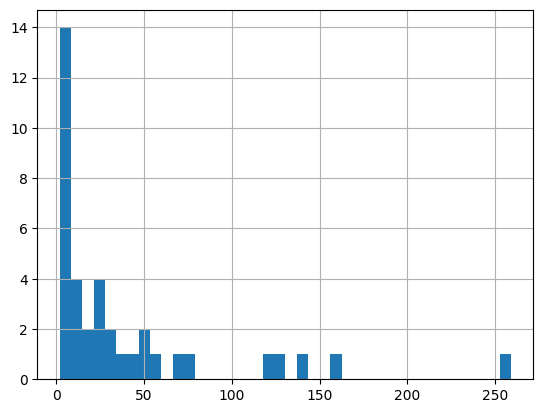

In [ ]:
new_df['token_count'][new_df['characters'] == "Gerald_Scarlett"].hist(bins = 40)

<Axes: >

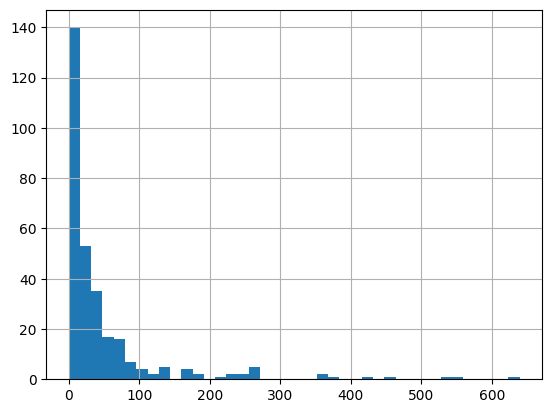

In [ ]:
new_df['token_count'].hist(bins = 40)

In [ ]:
new_df['token_count'].describe()

count    303.000000
mean      48.669967
std       87.345417
min        0.000000
25%        6.000000
50%       19.000000
75%       47.000000
max      639.000000
Name: token_count, dtype: float64

As there are otherwise not enough rows to perform analysis on, we split the text into chunks of 30 to perform training on.

In [ ]:
def split_text(text):
    words = word_tokenize(text)
    result = []
    current_item = []
    current_length = 0

    for word in words:
        if current_length + len(word) + len(current_item) > 10:
            if len(current_item) >= 20:
                result.append(current_item)
                current_item = [word]
                current_length = len(word)
            else:
                current_item += [word]
                current_length += len(word)
        else:
            current_item.append(word)
            current_length += len(word)

    if current_item:
        result.append(current_item)

    return result


def expand_dataframe(df, col_Name):
    rows = []
    for index, row in df.iterrows():
        name = row['characters']
        name_list = row[col_Name]
        for item in name_list:
             if len(item) > 4:
              rows.append([name, " ".join(item)])

    new_df = pd.DataFrame(rows, columns=['characters', 'Chunk'])
    return new_df

In [ ]:
convo_df_main['Chunks'] = convo_df_main['text_out_processed'].apply(split_text)
df_main_chunked = expand_dataframe(convo_df_main, "Chunks")

In [ ]:
df_main_chunked

,characters,Chunk
0,Melanie_Scarlett,something important tell hardly know say nearl...
1,Gerald_Scarlett,none county touch state well missy
2,Gerald_Scarlett,reason buy ask buy well use buy go mope child ...
3,Gerald_Scarlett,twelve oak usual cade settle set gallery sever...
4,Gerald_Scarlett,miss what s her name sweet little thing last y...
...,...,...
814,Ashley_Scarlett,man love woman love year finally get war go aw...
815,Ashley_Scarlett,find care much believe would killed die love c...
816,Ashley_Scarlett,love marry know ley see fool thought could mak...
817,Ashley_Scarlett,marry protect give free rein anything would ma...


In [ ]:
df_main_chunked['characters'].value_counts()

characters
Rhett_Scarlett      372
Melanie_Scarlett    193
Ashley_Scarlett     172
Gerald_Scarlett      82
Name: count, dtype: int64

Now this data can be vectorized:

In [206]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(ngram_range = (1, 3), max_df=0.9)

In [197]:
df_LR_Ashley = pd.DataFrame(data = {'text_out_processed' : processed_LR_Ashley,  'characters': "Ashley_Scarlett"})
df_LR_Gerald = pd.DataFrame(data = {'text_out_processed' : processed_LR_Gerald,  'characters': "Gerald_Scarlett"})
df_LR_Melanie = pd.DataFrame(data = {'text_out_processed' : processed_LR_Melanie,  'characters': "Melanie_Scarlett"})
df_LR_Rhett = pd.DataFrame(data = {'text_out_processed' : processed_LR_Rhett,  'characters': "Rhett_Scarlett"})

df_main_chunked = pd.concat([df_LR_Ashley, df_LR_Gerald, df_LR_Melanie, df_LR_Rhett]).sample(frac=1, random_state=42).reset_index(drop=True)

In [166]:
processed_LR_Gerald

[]

As there is a class imbalance, we first want to select 30 real observations from each group, and then augment the training classes through SMOTE:

In [201]:
def select_equal_groups(group: pd.core.groupby.generic.DataFrameGroupBy, n: int):
    return group.sample(min(n, len(group)), random_state=42)

df_test = df_main_chunked.groupby('characters', group_keys=False)\
          .apply(select_equal_groups, 50)

In [202]:
df_train = df_main_chunked[~df_main_chunked.index.isin(df_test.index)]

In [203]:
print(df_train['characters'].value_counts())
print(df_test['characters'].value_counts())

characters
Rhett_Scarlett      578
Melanie_Scarlett    275
Ashley_Scarlett     236
Gerald_Scarlett      86
Name: count, dtype: int64
characters
Ashley_Scarlett     50
Gerald_Scarlett     50
Melanie_Scarlett    50
Rhett_Scarlett      50
Name: count, dtype: int64


As one class is overbalanced, we want to reduce the majority class to 150 so that for Gerald the oversampling is not too much:

In [204]:
df_train = df_train.groupby('characters', group_keys=False)\
          .apply(select_equal_groups, 250)

In [208]:
X_train = vectorizer.fit_transform(df_train['text_out_processed'])
X_test = vectorizer.transform(df_test['text_out_processed'])
y_train = df_train.characters.reset_index(drop = True)
y_test = df_test.characters.reset_index(drop = True)

In [209]:
y_train.value_counts()

characters
Melanie_Scarlett    250
Rhett_Scarlett      250
Ashley_Scarlett     236
Gerald_Scarlett      86
Name: count, dtype: int64

In [210]:
y_test.value_counts()

characters
Ashley_Scarlett     50
Gerald_Scarlett     50
Melanie_Scarlett    50
Rhett_Scarlett      50
Name: count, dtype: int64

In [211]:
!pip install imbalanced-learn

In [212]:
from imblearn.over_sampling import SMOTE

def smote_upsampling(X, y):
    """
    Perform SMOTE upsampling on the input features and target labels.

    Parameters:
        X (array-like): Input features.
        y (array-like): Target labels.

    Returns:
        X_resampled (array-like): Resampled features.
        y_resampled (array-like): Resampled target labels.
    """
    # Initialize SMOTE object
    smote = SMOTE()

    # Perform SMOTE upsampling
    X_resampled, y_resampled = smote.fit_resample(X, y)

    return X_resampled, y_resampled

# Example usage:
# X_train and y_train are your training features and labels, respectively
X_train_resampled, y_train_resampled = smote_upsampling(X_train, y_train)

In [213]:
print(y_train_resampled.value_counts())

characters
Ashley_Scarlett     250
Gerald_Scarlett     250
Melanie_Scarlett    250
Rhett_Scarlett      250
Name: count, dtype: int64


##5B. TF-IDF per class statistics

In [214]:
train_df = pd.DataFrame(X_train.toarray(), columns=vectorizer.get_feature_names_out())
train_df['y'] = y_train

In [215]:
grouped_train = train_df.groupby('y').sum()

In [216]:
# Find the most popular tokens for each class
top_tokens_train = {}

for class_label, data in grouped_train.iterrows():
    top_tokens_train[class_label] = data.nlargest(20)

In [217]:
top_tokens_train

{'Ashley_Scarlett': know     4.598463
 ley      3.711336
 go       3.661090
 like     3.656211
 well     3.258412
 love     3.084647
 get      2.863064
 think    2.583283
 want     2.451610
 never    2.412004
 war      2.410040
 could    2.353240
 would    2.353211
 money    2.159060
 say      2.131049
 come     2.113499
 world    2.022675
 look     2.017714
 thing    2.004395
 life     1.952492
 Name: Ashley_Scarlett, dtype: float64,
 'Gerald_Scarlett': mother       2.263920
 like         1.245811
 marry        1.236774
 pa           1.235134
 know         1.136817
 say          1.119250
 puss         1.075728
 cry          1.043788
 good         0.967611
 die          0.966524
 thing        0.945450
 let stay     0.937677
 daughter     0.929235
 take         0.917819
 go           0.911956
 gentleman    0.904673
 house        0.896809
 well         0.889060
 come         0.887867
 would        0.878018
 Name: Gerald_Scarlett, dtype: float64,
 'Melanie_Scarlett': get         4.270653


In [218]:
from collections import Counter

# Combine all the tokens from top_tokens_train
all_tokens = []
for class_label, tokens in top_tokens_train.items():
    all_tokens.extend(tokens.index)

# Count the occurrences of each token
token_counts = Counter(all_tokens)

# Convert the Counter object to a set
token_set = set(token_counts.items())

print("Set of all tokens and their counts:")
print(token_set)

Set of all tokens and their counts:
{('love', 1), ('let stay', 1), ('make', 1), ('get', 3), ('daughter', 1), ('one', 1), ('let', 1), ('good', 1), ('marry', 1), ('war', 1), ('home', 1), ('want', 2), ('cry', 1), ('money', 2), ('like', 3), ('well', 4), ('darling', 1), ('mother', 1), ('hospital', 1), ('think', 3), ('could', 2), ('gentleman', 1), ('take', 2), ('house', 1), ('must', 1), ('puss', 1), ('give', 1), ('know', 4), ('thing', 3), ('come', 3), ('world', 1), ('see', 1), ('man', 1), ('leave', 1), ('die', 2), ('would', 4), ('say', 4), ('life', 1), ('right', 1), ('tell', 1), ('dear', 1), ('go', 4), ('never', 2), ('look', 2), ('ley', 2), ('pa', 1), ('baby', 1)}


In [219]:
common_tokens = {token: count for token, count in token_set if count > 1}

In [220]:
import numpy as np

In [221]:
common_tokens

{'get': 3,
 'want': 2,
 'money': 2,
 'like': 3,
 'well': 4,
 'think': 3,
 'could': 2,
 'take': 2,
 'know': 4,
 'thing': 3,
 'come': 3,
 'die': 2,
 'would': 4,
 'say': 4,
 'go': 4,
 'never': 2,
 'look': 2,
 'ley': 2}

In [222]:
# Remove common tokens from the vectorizers
common_tokens_indices = [vectorizer.vocabulary_[token] for token in common_tokens]
#vectorizer.vocabulary_ = {token: index for token, index in vectorizer.vocabulary_.items() if index not in common_tokens_indices}

In [223]:
X_train_resampled.shape

(1000, 16146)

In [224]:
len(vectorizer.vocabulary_)

16146

In [225]:
#X_train_resampled = np.delete(X_train_resampled.toarray(), common_tokens_indices, axis=1)

In [226]:
#X_test= np.delete(X_test.toarray(), common_tokens_indices, axis=1)

In [227]:
#from scipy.sparse import csr_matrix
#X_train_resampled = csr_matrix(X_train_resampled)
#X_test_resampled = csr_matrix(X_test)

In [228]:
top_tokens_train['Ashley_Scarlett']

know     4.598463
ley      3.711336
go       3.661090
like     3.656211
well     3.258412
love     3.084647
get      2.863064
think    2.583283
want     2.451610
never    2.412004
war      2.410040
could    2.353240
would    2.353211
money    2.159060
say      2.131049
come     2.113499
world    2.022675
look     2.017714
thing    2.004395
life     1.952492
Name: Ashley_Scarlett, dtype: float64

In [229]:
top_tokens_train['Melanie_Scarlett']

get         4.270653
know        3.986061
go          3.961174
think       3.536901
baby        3.128501
come        3.117953
must        3.080578
ley         3.053226
well        2.889307
would       2.870336
home        2.835688
darling     2.766429
take        2.630686
look        2.587292
die         2.552318
say         2.533588
could       2.354321
dear        2.336029
right       2.311796
hospital    2.290287
Name: Melanie_Scarlett, dtype: float64

In [230]:
top_tokens_train['Rhett_Scarlett']

know     3.810663
go       3.504878
want     3.472720
would    3.465559
get      3.332340
think    3.165410
say      2.932726
like     2.772990
never    2.722726
money    2.653987
see      2.608501
well     2.403961
tell     2.319856
make     2.250237
man      1.981775
one      1.915464
let      1.859565
give     1.842534
leave    1.799004
thing    1.776410
Name: Rhett_Scarlett, dtype: float64

In [231]:
top_tokens_train['Gerald_Scarlett']

mother       2.263920
like         1.245811
marry        1.236774
pa           1.235134
know         1.136817
say          1.119250
puss         1.075728
cry          1.043788
good         0.967611
die          0.966524
thing        0.945450
let stay     0.937677
daughter     0.929235
take         0.917819
go           0.911956
gentleman    0.904673
house        0.896809
well         0.889060
come         0.887867
would        0.878018
Name: Gerald_Scarlett, dtype: float64

##6. Logistic Regression


We perform a GridSearch on the training data

In [232]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold

#make a list of parameters:
param_grid = {
    'C': [10, 100],  # Regularization parameter
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']# Penalty term
}

# Initialize and fit logistic regression model
logreg = LogisticRegression(max_iter=1000)
gridsearch = GridSearchCV(logreg, param_grid, cv=KFold(5, shuffle=True, random_state=42), verbose=2, n_jobs=-1)

In [ ]:
gridsearch.fit(X_train_resampled, y_train_resampled)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


Then we take the best results of the grisearch and fit it to the model:

In [ ]:
cv_results_df = pd.DataFrame(gridsearch.cv_results_)

In [ ]:
cv_results_df.sort_values(by='mean_test_score', ascending=False)

In [ ]:
logregfinal = LogisticRegression(max_iter = 1000, solver = "liblinear", penalty = "l2", C = 100)
logregfinal.fit(X_train_resampled, y_train_resampled)

LogisticRegression(C=100, max_iter=1000, solver='liblinear')

In [ ]:
y_pred = logregfinal.predict(X_test)

In [ ]:
y_pred

array(['Rhett_Scarlett', 'Ashley_Scarlett', 'Melanie_Scarlett',
       'Melanie_Scarlett', 'Ashley_Scarlett', 'Ashley_Scarlett',
       'Rhett_Scarlett', 'Ashley_Scarlett', 'Rhett_Scarlett',
       'Rhett_Scarlett', 'Ashley_Scarlett', 'Ashley_Scarlett',
       'Ashley_Scarlett', 'Ashley_Scarlett', 'Ashley_Scarlett',
       'Rhett_Scarlett', 'Ashley_Scarlett', 'Rhett_Scarlett',
       'Rhett_Scarlett', 'Melanie_Scarlett', 'Melanie_Scarlett',
       'Rhett_Scarlett', 'Rhett_Scarlett', 'Ashley_Scarlett',
       'Ashley_Scarlett', 'Ashley_Scarlett', 'Melanie_Scarlett',
       'Ashley_Scarlett', 'Rhett_Scarlett', 'Melanie_Scarlett',
       'Melanie_Scarlett', 'Rhett_Scarlett', 'Ashley_Scarlett',
       'Melanie_Scarlett', 'Ashley_Scarlett', 'Gerald_Scarlett',
       'Rhett_Scarlett', 'Rhett_Scarlett', 'Gerald_Scarlett',
       'Ashley_Scarlett', 'Gerald_Scarlett', 'Melanie_Scarlett',
       'Gerald_Scarlett', 'Ashley_Scarlett', 'Rhett_Scarlett',
       'Melanie_Scarlett', 'Rhett_Scarlett', 

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(y_test, y_pred))

                  precision    recall  f1-score   support

 Ashley_Scarlett       0.50      0.47      0.48        30
 Gerald_Scarlett       0.90      0.30      0.45        30
Melanie_Scarlett       0.50      0.70      0.58        30
  Rhett_Scarlett       0.40      0.53      0.46        30

        accuracy                           0.50       120
       macro avg       0.57      0.50      0.49       120
    weighted avg       0.57      0.50      0.49       120



In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=82d301523b6712201fb4b07e035d450bed5e572384b220bf91363d5e2327e89b
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
import eli5
eli5.show_weights(logregfinal, feature_names = vectorizer.get_feature_names_out())

Check the results of the performance

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, recall_score, f1_score, precision_score

default_metrics = {
    'accuracy': accuracy_score,
    'recall': lambda y_t, y_p: recall_score(y_t, y_p, zero_division="warn", average='micro'),
    'precision': lambda y_t, y_p: precision_score(y_t, y_p, zero_division="warn", average='micro'),
    'f1': lambda y_t, y_p: f1_score(y_t, y_p, zero_division= "warn", average ='macro')
}


def plot_accuracy(df, metrics):
    y_true = df['characters']
    y_pred = df['prediction']

    # Plot count confusion matrix
    cm_disp = ConfusionMatrixDisplay.from_predictions(y_true, y_pred)

    # Show plot
    plt.show()

    # Calculate metrics
    metrics = {metric_name: metric_func(y_true, y_pred) for metric_name, metric_func in metrics.items()}
    print(metrics)

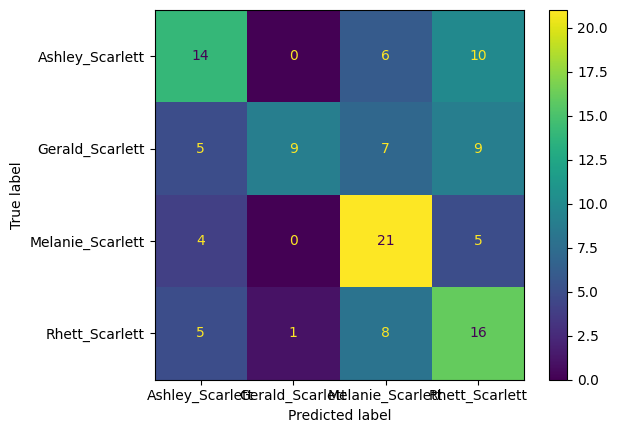

{'accuracy': 0.5, 'recall': 0.5, 'precision': 0.5, 'f1': 0.49330870279146144}


In [ ]:
df_test['prediction'] = y_pred
plot_accuracy(df_test, default_metrics)

In [ ]:
df_test[(df_test['characters'] == "Ashley_Scarlett") & (df_test['prediction'] == "Rhett_Scarlett")]

,characters,Chunk,prediction
498,Ashley_Scarlett,fiddle partly reason partly tell truth pid rea...,Rhett_Scarlett
513,Ashley_Scarlett,talk go new york think nothing atlanta besides...,Rhett_Scarlett
555,Ashley_Scarlett,lazy little creole work hard like poor devil m...,Rhett_Scarlett
365,Ashley_Scarlett,skunk ever one become wonder wonder become tar...,Rhett_Scarlett
225,Ashley_Scarlett,tara must go dear let kiss pretty face must de...,Rhett_Scarlett
246,Ashley_Scarlett,like quality like beget like realize still che...,Rhett_Scarlett
497,Ashley_Scarlett,make good mad well aim pray good plenty reason...,Rhett_Scarlett
355,Ashley_Scarlett,mrs wilke bother husband capture first manassa...,Rhett_Scarlett
446,Ashley_Scarlett,ah difference even though poor still feel like...,Rhett_Scarlett
240,Ashley_Scarlett,might hear pray compose like well sometimes ac...,Rhett_Scarlett


In [ ]:
df_test = df_test.reset_index()

In [ ]:
eli5.show_prediction(logregfinal, X_test[15], top =20, feature_names = vectorizer.get_feature_names_out())

In [ ]:
df_test.loc[6, 'Chunk']

'talk go new york think nothing atlanta besides place say anything wife duty go husband goes need position fill go'

## 8. Sentiment Analysis Regression

In [ ]:
from transformers import pipeline
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained("lxyuan/distilbert-base-multilingual-cased-sentiments-student", max_length = 512, truncation = True)

distilled_student_sentiment_classifier = pipeline(
    model="lxyuan/distilbert-base-multilingual-cased-sentiments-student",
    tokenizer = tokenizer,
    return_all_scores=True
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/373 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/759 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/541M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/pipelines/text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [ ]:
tokenizer_kwargs = {'truncation':True,'max_length':512}
def sentiment_analysis_score(text):
    if len(text.split(" ")) > 5:
      sentiment_results = distilled_student_sentiment_classifier(text, **tokenizer_kwargs)
      positive_score = sentiment_results[0][0]['score']
      negative_score = sentiment_results[0][2]['score']
      return positive_score - negative_score
    return

In [ ]:
convo_df_main['sent_score'] = convo_df_main['text_out'].apply(sentiment_analysis_score)

In [ ]:
convo_df_main.groupby(['characters']).agg({'sent_score': 'median'})

,sent_score
characters,
Ashley_Scarlett,-0.372742
Gerald_Scarlett,-0.322369
Melanie_Scarlett,-0.294469
Rhett_Scarlett,-0.356902


<Axes: >

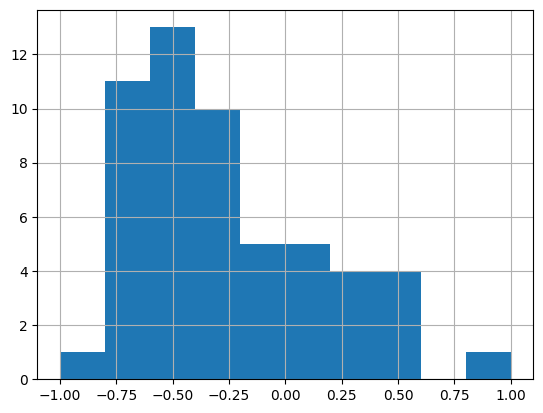

In [ ]:
convo_df_main['sent_score'][convo_df_main['characters'] == "Ashley_Scarlett"].hist(range=[-1, 1])

<Axes: >

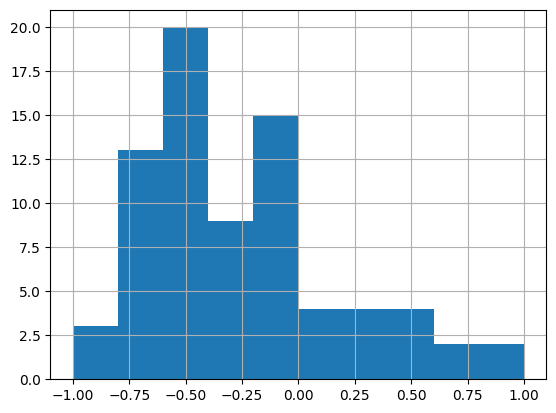

In [ ]:
convo_df_main['sent_score'][convo_df_main['characters'] == "Rhett_Scarlett"].hist(range=[-1, 1])

<Axes: >

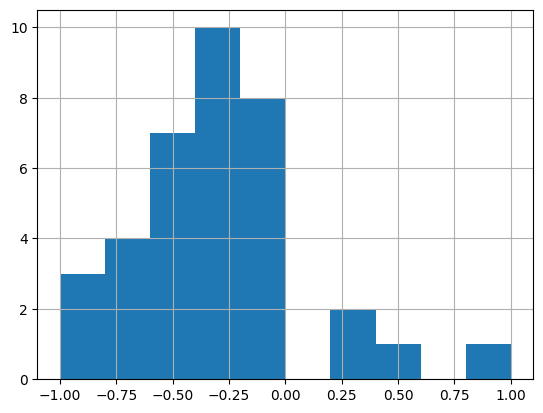

In [ ]:
convo_df_main['sent_score'][convo_df_main['characters'] == "Gerald_Scarlett"].hist(range=[-1, 1])

<Axes: >

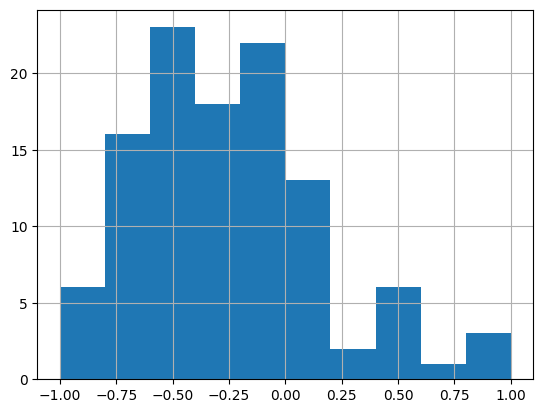

In [ ]:
convo_df_main['sent_score'][convo_df_main['characters'] == "Melanie_Scarlett"].hist(range=[-1, 1])

## 9. LDA

Melanie_Scarlett

[(0, [('mind', 0.020650204), ('never', 0.020456955), ('like', 0.020313324), ('good', 0.017995), ('money', 0.01736973), ('ever', 0.0151015725), ('shall', 0.015093174), ('body', 0.015076833), ('woman', 0.013674852), ('wilke', 0.012140028)]), (1, [('would', 0.026597332), ('like', 0.020927716), ('tara', 0.019466994), ('never', 0.01477278), ('mrs', 0.013819616), ('anything', 0.013327772), ('yes', 0.012031081), ('money', 0.01172044), ('dear', 0.0115517005), ('home', 0.011387832)]), (2, [('never', 0.027307056), ('long', 0.022449512), ('could', 0.020875761), ('good', 0.01998222), ('time', 0.016795097), ('man', 0.015048151), ('thing', 0.010901624), ('dear', 0.01089778), ('like', 0.010722054), ('friend', 0.010114623)]), (3, [('like', 0.038760427), ('well', 0.018970212), ('child', 0.01753097), ('house', 0.016641464), ('something', 0.016233455), ('never', 0.015656268), ('would', 0.013687283), ('yes', 0.012948076), ('man', 0.01266569), ('one', 0.012665604)]), (4, [('yes', 0.033495154), ('would', 0.

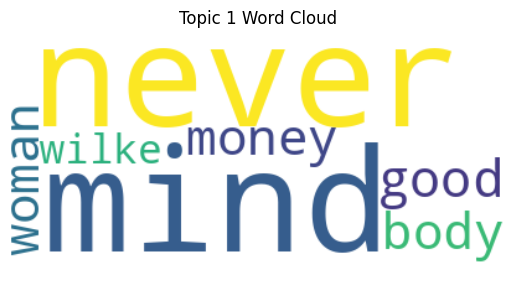

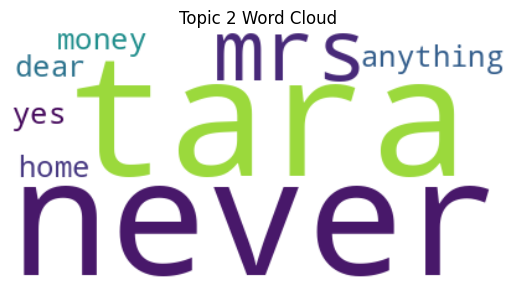

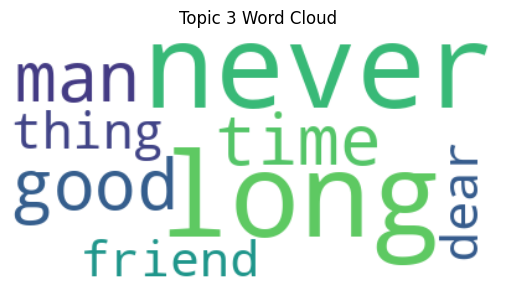

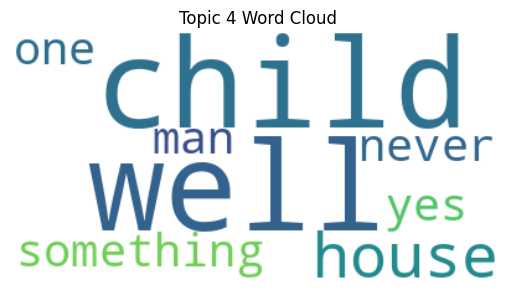

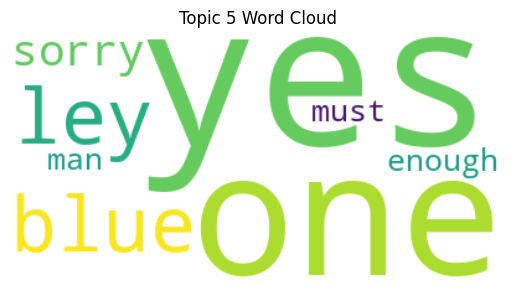

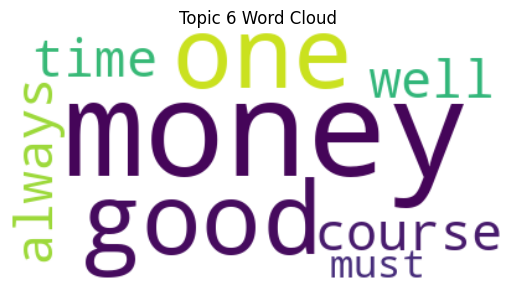

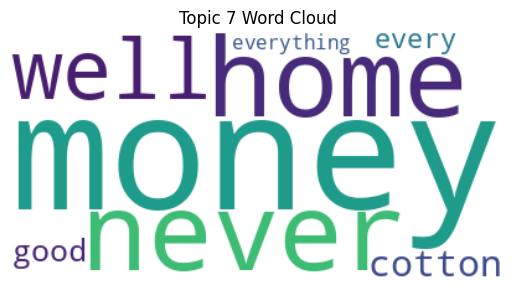

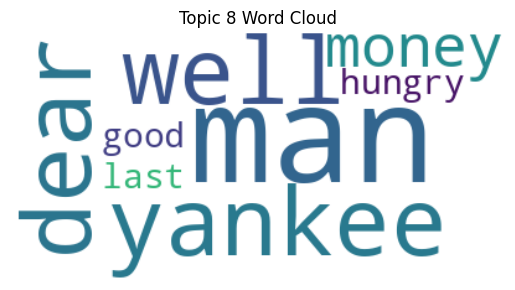

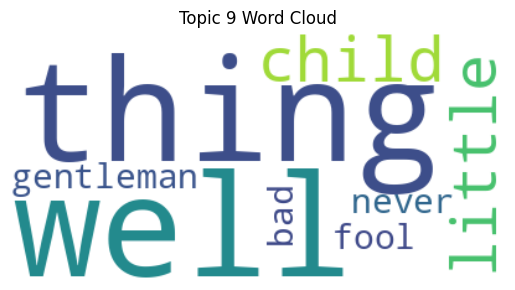

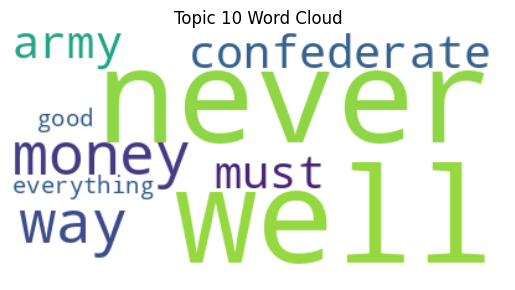

In [147]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
#corpus = [text.split() for text in combined_df_Melanie['text_out_processed']]
corpus = [word_tokenize(chunk) for chunk in processed_TM_Rhett]
texts_concatenated = [word for sublist in corpus for word in sublist]


# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
dictionary.filter_extremes(no_below=2, no_above=0.5)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 10
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha="auto", eta="auto", random_state = 42)

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)
print(topics)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [56]:
texts_concatenated = [" ".join(words) for words in all_convos_Melanie]

[(0, [('like', 0.05666095), ('good', 0.048707947), ('man', 0.040756084), ('girl', 0.032803047), ('daughter', 0.032802977), ('old', 0.02485121), ('pa', 0.02485121), ('well', 0.024850672), ('two', 0.01689877), ('every', 0.01689877)]), (1, [('puss', 0.027005332), ('pa', 0.027005332), ('ley', 0.027004592), ('miss', 0.027004283), ('fine', 0.020458858), ('different', 0.020458547), ('old', 0.020458546), ('twin', 0.020458546), ('sure', 0.020458546), ('young', 0.020458546)]), (2, [('mother', 0.08909127), ('yankees', 0.04545466), ('house', 0.030909117), ('gentleman', 0.030909117), ('would', 0.030909117), ('pa', 0.030909117), ('never', 0.030909114), ('like', 0.030909114), ('god', 0.030909114), ('week', 0.030909114)]), (3, [('child', 0.040941365), ('nothing', 0.040941365), ('orrow', 0.031017201), ('money', 0.03101615), ('miss', 0.021093188), ('ley', 0.021092046), ('home', 0.021091908), ('daughter', 0.021091763), ('good', 0.021091634), ('glad', 0.02109093)]), (4, [('right', 0.052378796), ('god', 0.

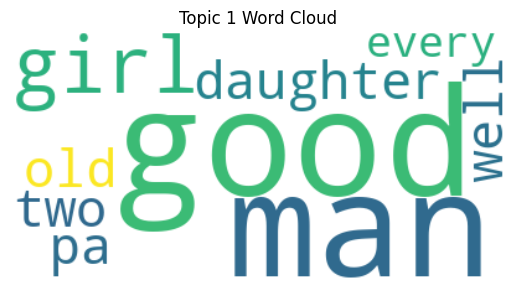

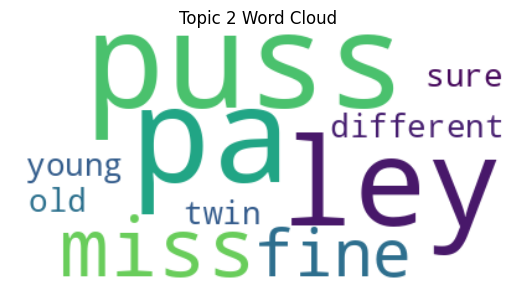

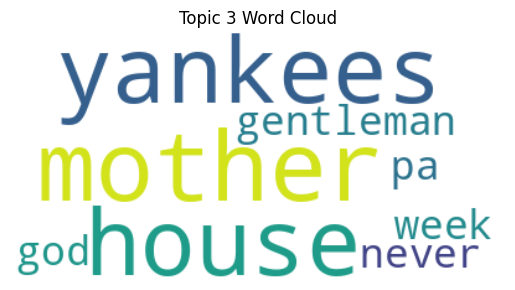

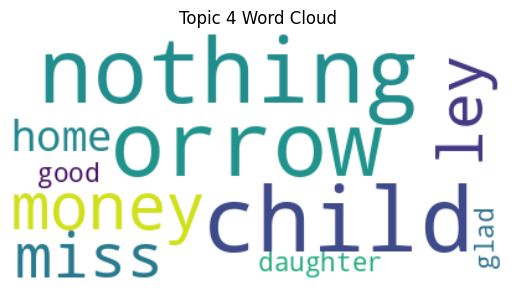

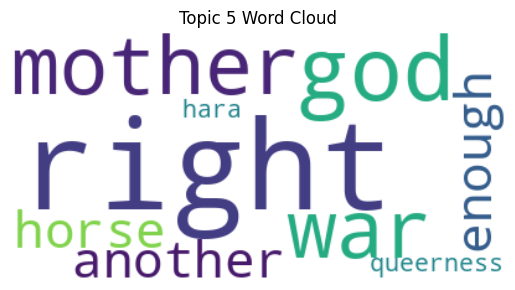

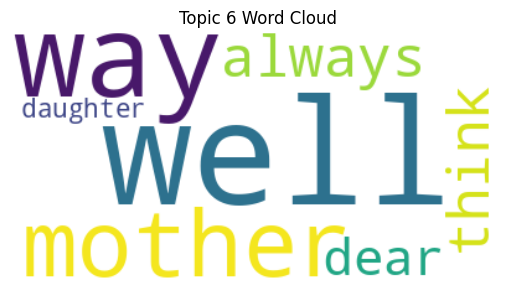

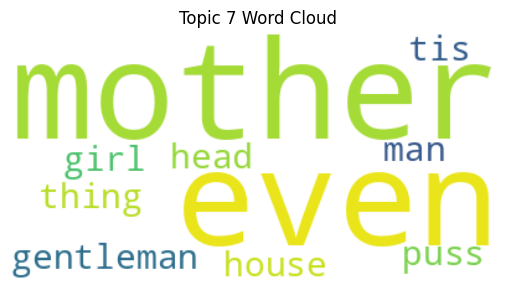

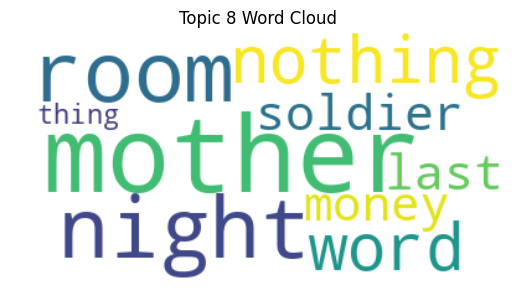

In [154]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
#corpus = [text.split() for text in combined_df_Melanie['text_out_processed']]
corpus = [word_tokenize(chunk) for chunk in processed_TM_Gerald]
texts_concatenated = [word for sublist in corpus for word in sublist]


# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
dictionary.filter_extremes(no_below=2, no_above=0.5)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 8
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha=0.02, eta="auto", random_state = 42)

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)
print(topics)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

[(0, [('home', 0.054341808), ('never', 0.03480685), ('must', 0.034801044), ('well', 0.023309175), ('could', 0.020151274), ('yes', 0.02014547), ('ley', 0.01613085), ('time', 0.015266082), ('big', 0.015266081), ('good', 0.015260276)]), (1, [('must', 0.062098864), ('well', 0.037055228), ('house', 0.030377613), ('could', 0.025417887), ('even', 0.020460775), ('husband', 0.020460775), ('lady', 0.015500552), ('rude', 0.015500552), ('ever', 0.015500552), ('would', 0.015500552)]), (2, [('ley', 0.04733178), ('dear', 0.030313563), ('baby', 0.030313563), ('would', 0.026058994), ('god', 0.0175499), ('never', 0.01754989), ('hara', 0.017548809), ('mother', 0.017538575), ('o', 0.015087256), ('quite', 0.013295342)]), (3, [('would', 0.041798584), ('well', 0.035429403), ('home', 0.019509707), ('god', 0.019506015), ('ley', 0.019506015), ('dr', 0.019506015), ('like', 0.019506015), ('baby', 0.016321335), ('little', 0.016321335), ('dear', 0.013136662)]), (4, [('baby', 0.027951932), ('dee', 0.027939562), ('pe

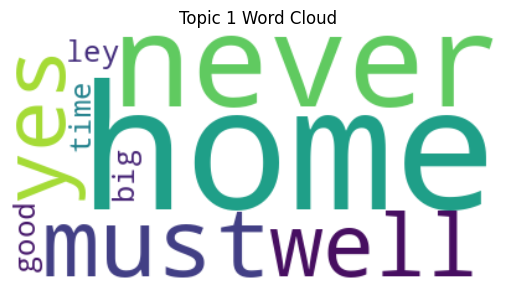

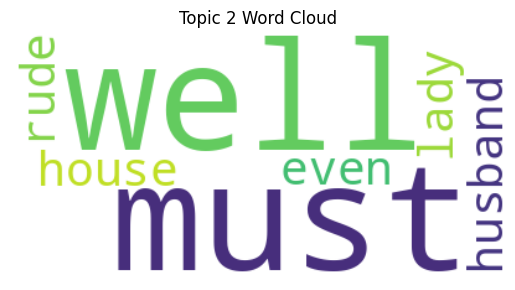

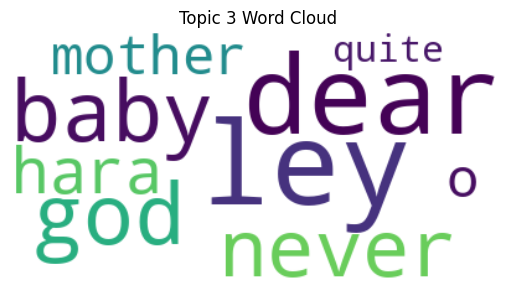

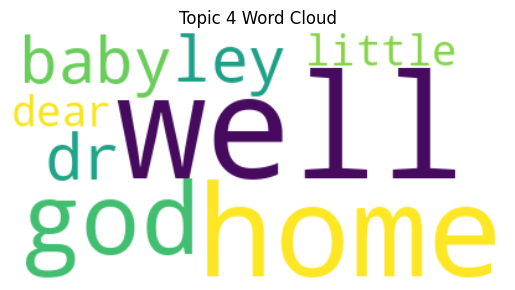

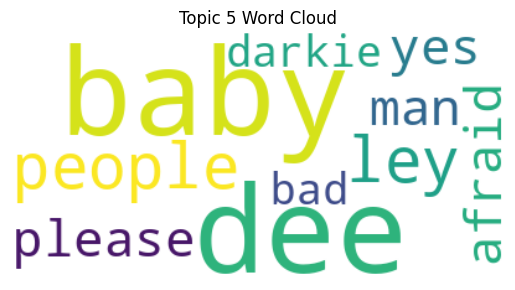

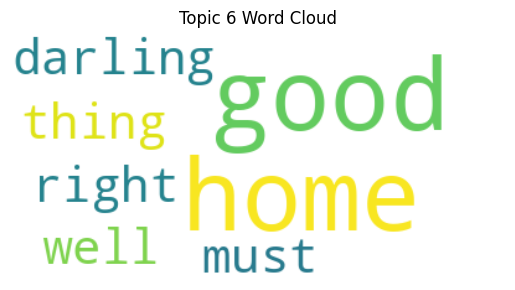

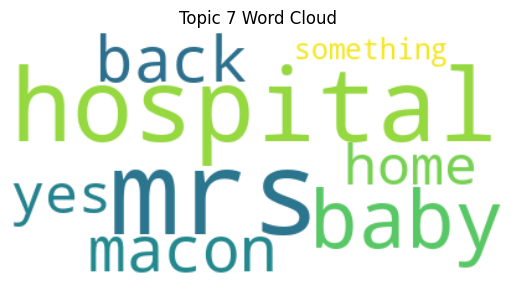

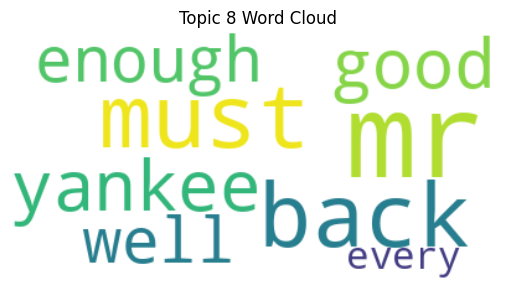

In [153]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
#corpus = [text.split() for text in combined_df_Melanie['text_out_processed']]
corpus = [word_tokenize(chunk) for chunk in processed_TM_Melanie]
texts_concatenated = [word for sublist in corpus for word in sublist]


# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
dictionary.filter_extremes(no_below=2, no_above=0.5)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 8
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha=0.02, eta="auto", random_state = 42)

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)
print(topics)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [85]:
ldamodel.alpha

array([0.08006216, 0.03947606, 0.04295213, 0.03109775, 0.02341744],
      dtype=float32)

[(0, [('would', 0.037974875), ('child', 0.03270092), ('like', 0.032700565), ('could', 0.02215195), ('anything', 0.016878363), ('thing', 0.016877646), ('people', 0.016877646), ('bad', 0.016877646), ('coward', 0.016877646), ('nothing', 0.016877646)]), (1, [('ley', 0.029119955), ('woman', 0.029112564), ('time', 0.023520758), ('smart', 0.023519939), ('first', 0.023507843), ('without', 0.023507843), ('right', 0.017921077), ('world', 0.01791992), ('god', 0.016894156), ('long', 0.015062781)]), (2, [('well', 0.03925555), ('like', 0.0329837), ('ley', 0.023821522), ('world', 0.023821522), ('could', 0.021654423), ('must', 0.021642076), ('something', 0.019240437), ('tiful', 0.019179247), ('every', 0.017355729), ('money', 0.015658427)]), (3, [('ley', 0.04968988), ('money', 0.033526313), ('never', 0.02838611), ('thing', 0.025068704), ('man', 0.022830416), ('well', 0.019762939), ('bad', 0.013877262), ('like', 0.013877261), ('could', 0.013877261), ('good', 0.011638973)]), (4, [('war', 0.032577384), ('

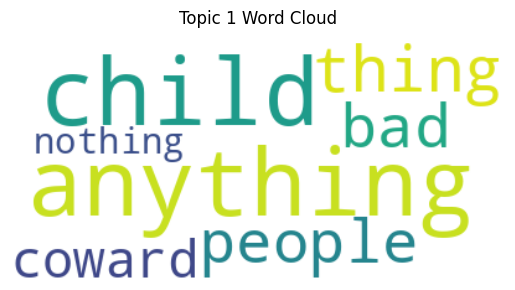

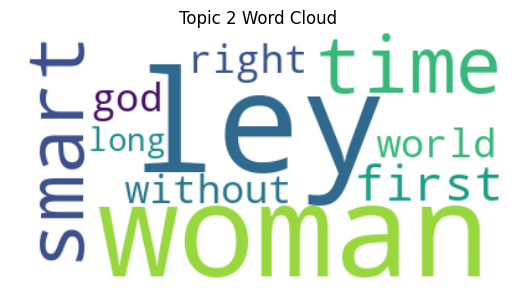

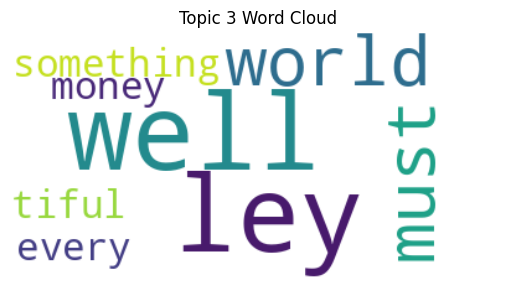

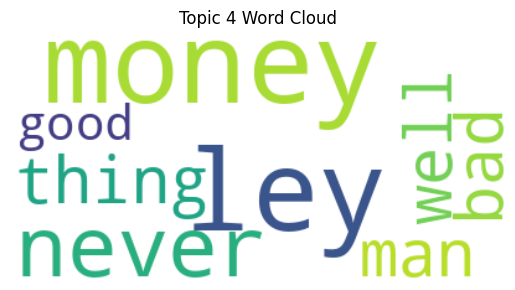

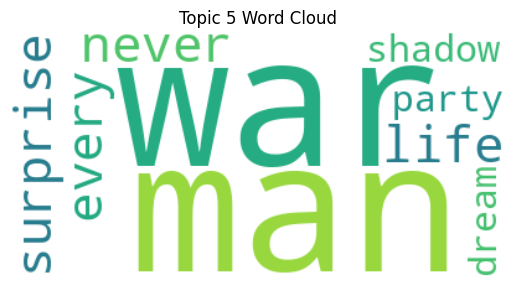

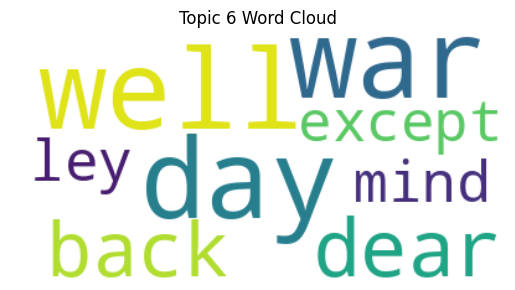

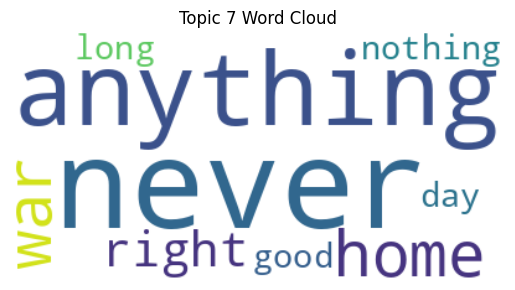

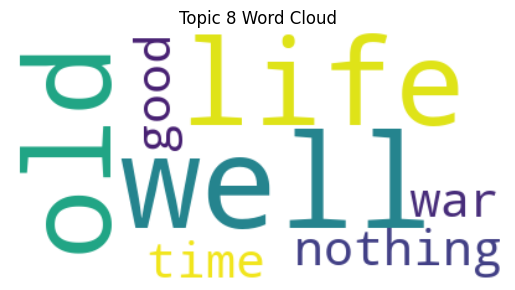

In [150]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
#corpus = [text.split() for text in combined_df_Melanie['text_out_processed']]
corpus = [word_tokenize(chunk) for chunk in processed_TM_Ashley]


# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
dictionary.filter_extremes(no_below=2, no_above=0.5)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 8
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha=0.02, eta=0.2, random_state = 42)

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)
print(topics)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

[(0, [('like', 0.018957274), ('well', 0.018105945), ('money', 0.014157573), ('people', 0.010740626), ('would', 0.010526541), ('sorry', 0.009563169), ('something', 0.009331654), ('could', 0.009046562), ('good', 0.007856769), ('real', 0.007855775)]), (1, [('never', 0.016416539), ('would', 0.014262914), ('money', 0.013197006), ('home', 0.010335619), ('child', 0.009322208), ('fool', 0.0072966195), ('yankee', 0.0072964816), ('like', 0.0072918576), ('thing', 0.007287837), ('tara', 0.006283773)]), (2, [('never', 0.017319415), ('one', 0.010296433), ('money', 0.010226083), ('like', 0.009875745), ('would', 0.009574779), ('well', 0.009573798), ('anything', 0.008627131), ('could', 0.0084002605), ('ever', 0.00714683), ('way', 0.0070505147)]), (3, [('could', 0.011947658), ('well', 0.010935547), ('long', 0.010320878), ('money', 0.00863671), ('home', 0.008631747), ('never', 0.0077232462), ('good', 0.0076944963), ('time', 0.007565017), ('thing', 0.0075234384), ('yes', 0.0074965423)]), (4, [('would', 0.

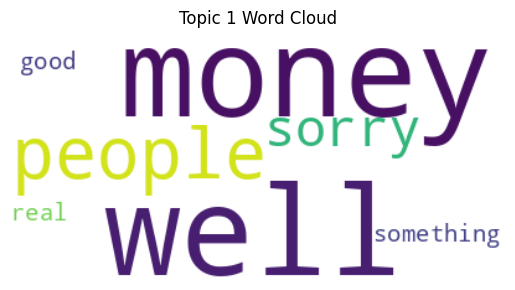

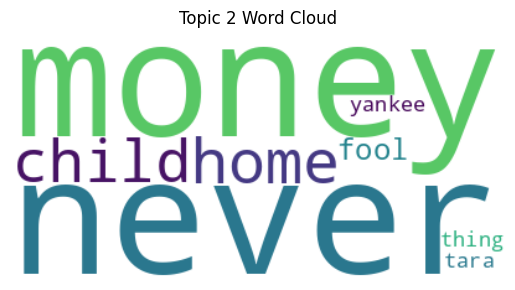

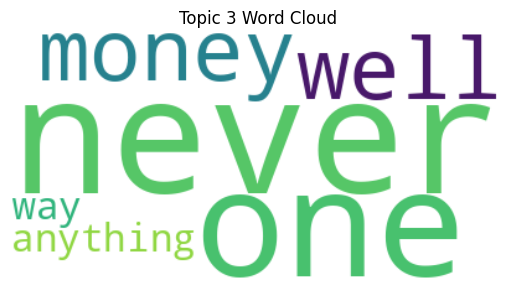

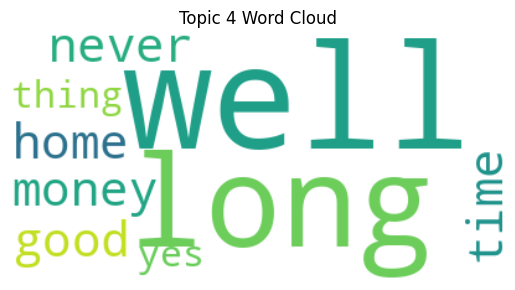

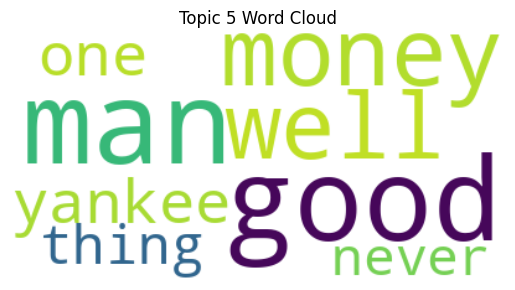

In [47]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
#corpus = [text.split() for text in combined_df_Melanie['text_out_processed']]
corpus = all_convos_Rhett
texts_concatenated = [word for sublist in corpus for word in sublist]

# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 5
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)
print(topics)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Melanie['text_out_processed'].apply(lambda x: x.split())

all_topics = []

# Iterate through each row and apply LDA
for text in texts:
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    text_topics = []
    for topic_id, topic in topics:
        text_topics.append([word for word, _ in topic])

    all_topics.append(text_topics)

# Print the topics for each text
for idx, topics in enumerate(all_topics):
    print(f"Text {idx + 1} Topics:")
    for topic_id, topic_words in enumerate(topics):
        print(f"Topic {topic_id + 1}: {topic_words}")


# Visualize topics using PyLDAvis
!pip install pyldavis==3.2.1
# First, install or upgrade PyLDAvis and Gensim
!pip install --upgrade pyldavis gensim

# Then, import and use PyLDAvis
import pyLDAvis.gensim
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Prepare visualization
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
vis

Text 1 Topics:
Topic 1: ['get', 'try', 'miss', 'thing', 'know', 'well', 'little', 'honey', 'think', 'take']
Topic 2: ['get', 'know', 'well', 'want', 'think', 'thing', 'mr', 'ever', 'miss', 'try']
Topic 3: ['get', 'know', 'try', 'home', 'think', 'thing', 'miss', 'take', 'little', 'mr']
Topic 4: ['get', 'know', 'well', 'thing', 'ever', 'try', 'honey', 'mr', 'miss', 'take']
Topic 5: ['get', 'try', 'know', 'well', 'want', 'honey', 'mr', 'take', 'little', 'home']
Text 2 Topics:
Topic 1: ['go', 'hospital', 'think', 'well', 'mrs', 'know', 'lady', 'quite', 'must', 'bring']
Topic 2: ['go', 'well', 'think', 'hospital', 'quite', 'mrs', 'reel', 'must', 'know', 'lady']
Topic 3: ['go', 'well', 'think', 'lady', 'must', 'know', 'hospital', 'like', 'see', 'minute']
Topic 4: ['well', 'think', 'go', 'know', 'must', 'hospital', 'mrs', 'reel', 'minute', 'time']
Topic 5: ['go', 'well', 'think', 'hospital', 'quite', 'know', 'reel', 'lady', 'mrs', 'must']
Text 3 Topics:
Topic 1: ['heart', 'ask', 'think', 'dea

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.089367 -0.023069       1        1  50.540437
0     -0.008534  0.115151       2        1  18.024642
4      0.107981 -0.041568       3        1  17.120582
2     -0.058758 -0.054625       4        1  14.311393
3      0.048678  0.004110       5        1   0.002945, topic_info=         Term       Freq      Total Category  logprob  loglift
44        ley  26.000000  26.000000  Default  30.0000  30.0000
162  hospital  13.000000  13.000000  Default  29.0000  29.0000
56      never  16.000000  16.000000  Default  28.0000  28.0000
354       bad  10.000000  10.000000  Default  27.0000  27.0000
353      baby  25.000000  25.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
56      never   0.000096  16.543746   Topic5  -6.8804  -1.6221
47       look   0.000096  19.081197   Topic5  -6.8804  -1.7648
353      baby   0.000096  25.109054   Topic5  -6.8806  -2.0395
77      thing   0.000096  14.856115   Topic5  -6.8807  -1.5148
105      back   0.000096  12.889991   Topic5  -6.8808  -1.3729

[364 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
909       4  0.760994  afternoon
345       1  0.344193         ah
345       4  0.688387         ah
269       3  0.740717      alarm
270       3  0.740727    alarmed
...     ...       ...        ...
634       4  0.760990        yas
635       4  0.760993       yell
525       1  0.618697        yes
525       2  0.123739        yes
525       4  0.247479        yes

[445 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 5, 3, 4])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


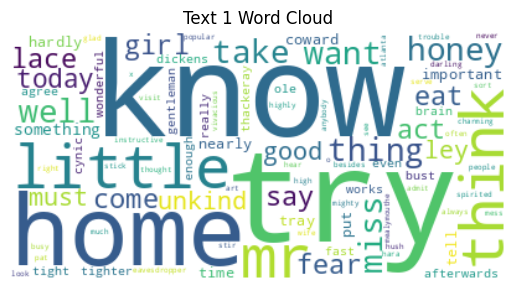

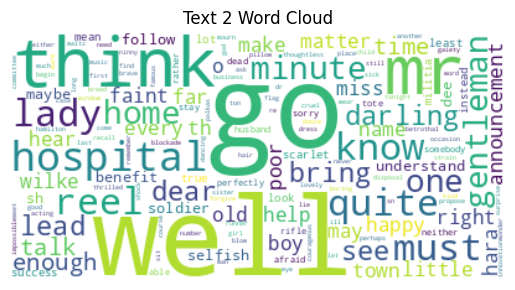

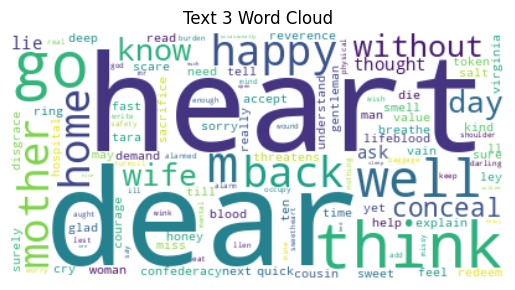

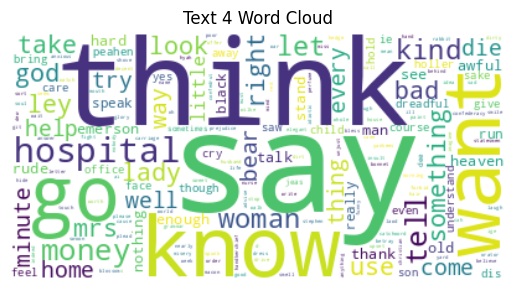

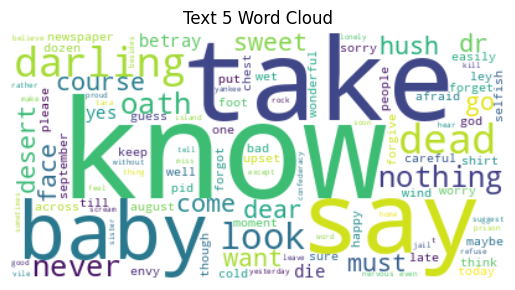

...

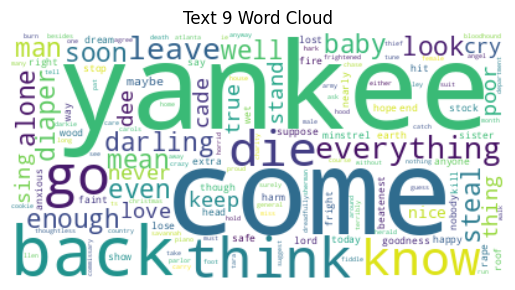

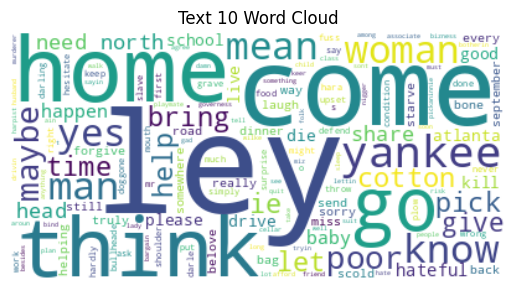

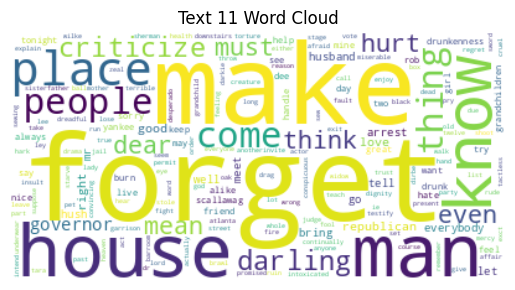

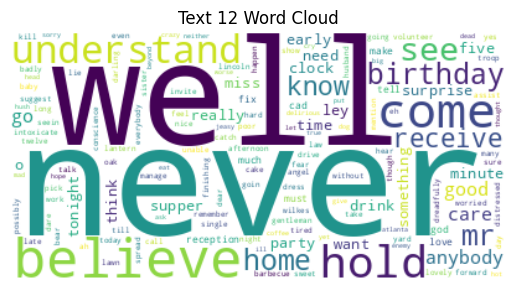

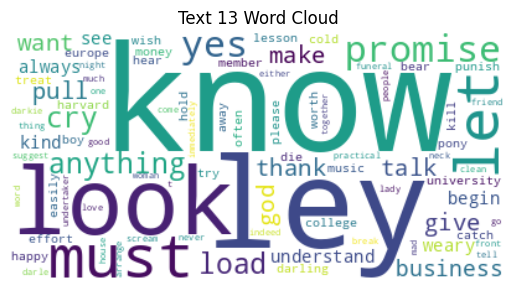

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Melanie['text_out_processed'].apply(lambda x: x.split())

# Iterate through each text and apply LDA
for idx, text in enumerate(texts):
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    topic_words = []
    for topic_id, topic in topics:
        topic_words.extend([word for word, _ in topic])

    # Generate word cloud for the text
    wordcloud = WordCloud(background_color='white').generate(' '.join(text))
    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Text {idx + 1} Word Cloud')
    plt.axis('off')
    plt.show()

Gerald_Scarlett

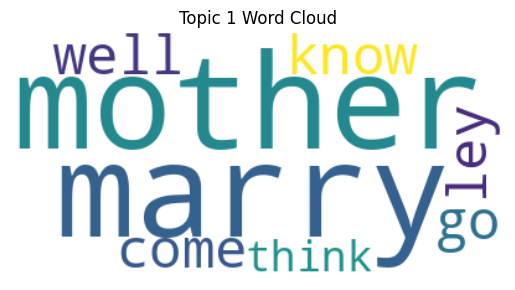

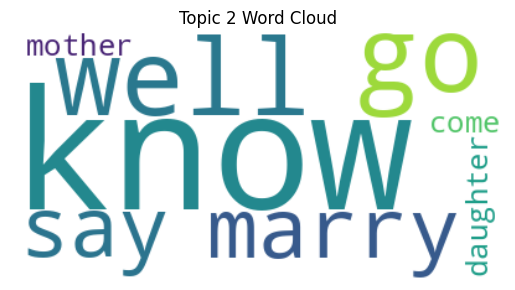

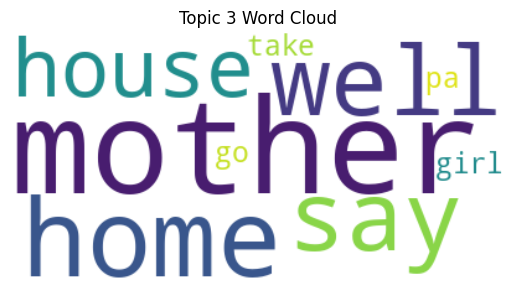

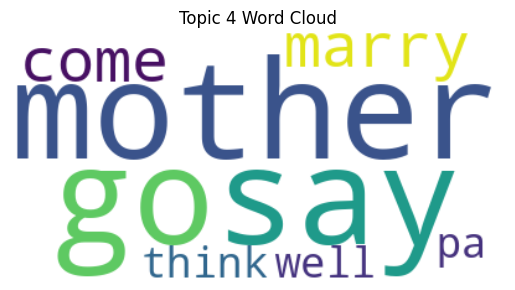

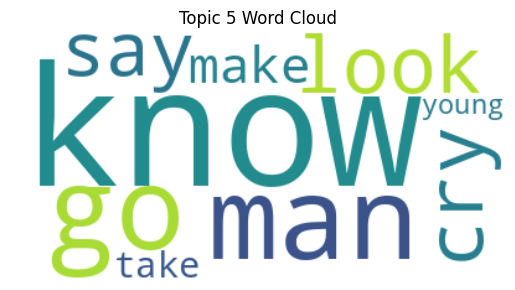

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
corpus = [text.split() for text in combined_df_Gerald['text_out_processed']]
texts_concatenated = [word for sublist in corpus for word in sublist]

# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 5
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Gerald['text_out_processed'].apply(lambda x: x.split())

all_topics = []

# Iterate through each row and apply LDA
for text in texts:
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    text_topics = []
    for topic_id, topic in topics:
        text_topics.append([word for word, _ in topic])

    all_topics.append(text_topics)

# Print the topics for each text
for idx, topics in enumerate(all_topics):
    print(f"Text {idx + 1} Topics:")
    for topic_id, topic_words in enumerate(topics):
        print(f"Topic {topic_id + 1}: {topic_words}")

# Visualize topics using PyLDAvis
!pip install pyldavis==3.2.1
# First, install or upgrade PyLDAvis and Gensim
!pip install --upgrade pyldavis gensim

# Then, import and use PyLDAvis
import pyLDAvis.gensim
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Prepare visualization
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text 1 Topics:
Topic 1: ['marry', 'like', 'daughter', 'go', 'would', 'come', 'ley', 'say', 'man', 'pa']
Topic 2: ['marry', 'ley', 'would', 'say', 'like', 'go', 'wilke', 'want', 'daughter', 'man']
Topic 3: ['marry', 'like', 'would', 'ley', 'say', 'well', 'come', 'go', 'daughter', 'want']
Topic 4: ['would', 'marry', 'like', 'come', 'daughter', 'ley', 'say', 'want', 'well', 'know']
Topic 5: ['like', 'marry', 'ley', 'would', 'well', 'go', 'come', 'daughter', 'say', 'wilke']
Text 2 Topics:
Topic 1: ['know', 'cry', 'look', 'make', 'go', 'take', 'man', 'young', 'like', 'say']
Topic 2: ['know', 'cry', 'look', 'right', 'go', 'make', 'like', 'man', 'mr', 'say']
Topic 3: ['know', 'look', 'man', 'young', 'like', 'go', 'say', 'cry', 'right', 'lament']
Topic 4: ['know', 'go', 'man', 'look', 'take', 'right', 'cry', 'say', 'make', 'war']
Topic 5: ['know', 'man', 'go', 'cry', 'look', 'say', 'like', 'take', 'young', 'right']
Text 3 Topics:
Topic 1: ['mother', 'home', 'well', 'would', 'house', 'girl', 's

  Using cached pyLDAvis-3.4.1-py3-none-any.whl (2.6 MB)
  Attempting uninstall: pyldavis
    Found existing installation: pyLDAvis 3.2.1
    Uninstalling pyLDAvis-3.2.1:
      Successfully uninstalled pyLDAvis-3.2.1


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.070393 -0.061381       1        1  61.142426
0      0.120285 -0.024102       2        1  38.849336
4     -0.016637  0.028524       3        1   0.003350
2     -0.016635  0.028524       4        1   0.002979
1     -0.016621  0.028436       5        1   0.001909, topic_info=       Term       Freq      Total Category  logprob  loglift
350    home   9.000000   9.000000  Default  30.0000  30.0000
456     die   8.000000   8.000000  Default  29.0000  29.0000
156   marry  12.000000  12.000000  Default  28.0000  28.0000
167  mother  22.000000  22.000000  Default  27.0000  27.0000
500   money   7.000000   7.000000  Default  26.0000  26.0000
..      ...        ...        ...      ...      ...      ...
221       s   0.000045   7.005098   Topic5  -6.4524  -1.0993
186     old   0.000045   8.056028   Topic5  -6.4524  -1.2390
139     let   0.000045   8.874795   Topic5  -6.4525  -1.3359
100     god   0.000045   8.056033   Topic5  -6.4526  -1.2392
302  yankee   0.000045   7.179265   Topic5  -6.4526  -1.1240

[342 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1         2  0.863556  afternoon
4         2  0.863536      alike
7         1  0.222672     always
7         2  0.668017     always
9         2  0.863523     amount
...     ...       ...        ...
300       2  0.580244      would
301       2  1.011745          x
302       1  0.696450     yankee
302       2  0.417870     yankee
558       1  1.010247    yankees

[236 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 5, 3, 2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


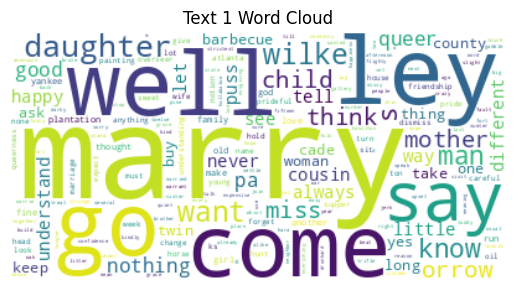

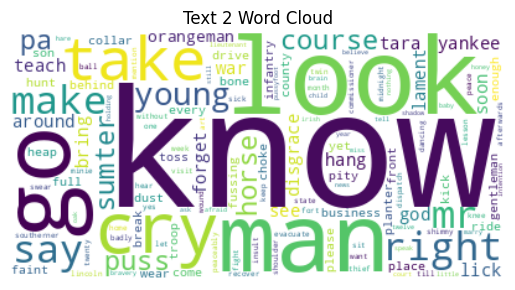

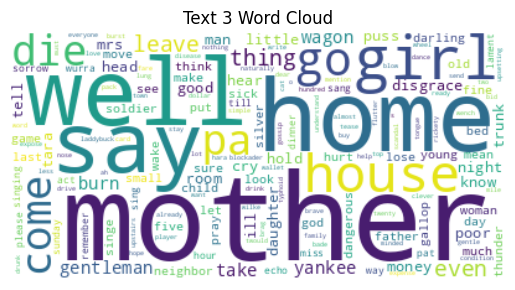

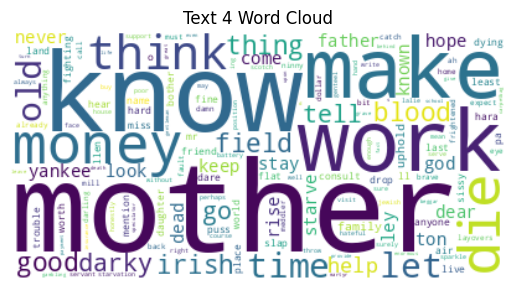

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Gerald['text_out_processed'].apply(lambda x: x.split())

# Iterate through each text and apply LDA
for idx, text in enumerate(texts):
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    topic_words = []
    for topic_id, topic in topics:
        topic_words.extend([word for word, _ in topic])

    # Generate word cloud for the text
    wordcloud = WordCloud(background_color='white').generate(' '.join(text))
    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Text {idx + 1} Word Cloud')
    plt.axis('off')
    plt.show()

Ashley_Scarlett

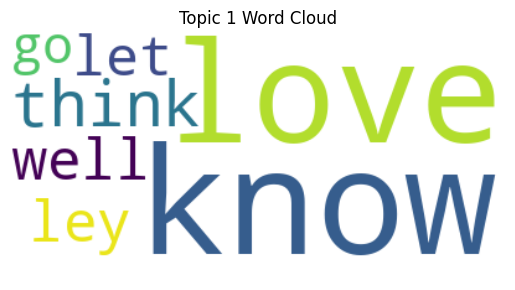

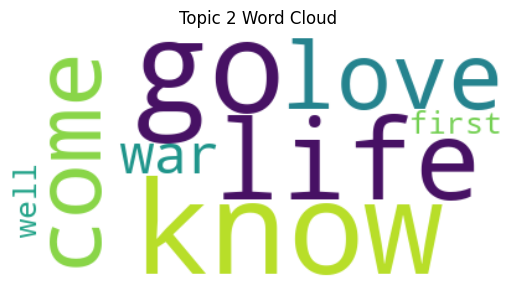

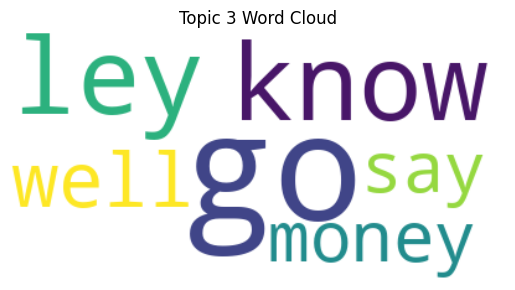

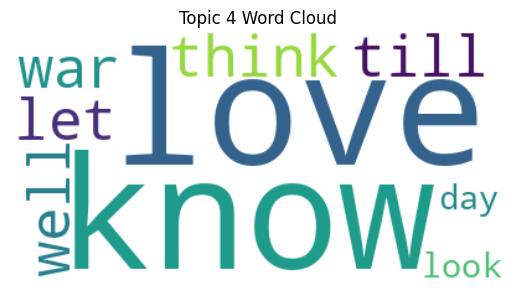

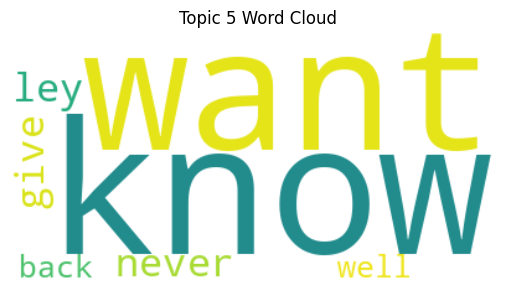

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
corpus = [text.split() for text in combined_df_Ashley['text_out_processed']]
texts_concatenated = [word for sublist in corpus for word in sublist]

# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 5
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Ashley['text_out_processed'].apply(lambda x: x.split())

all_topics = []

# Iterate through each row and apply LDA
for text in texts:
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    text_topics = []
    for topic_id, topic in topics:
        text_topics.append([word for word, _ in topic])

    all_topics.append(text_topics)

# Print the topics for each text
for idx, topics in enumerate(all_topics):
    print(f"Text {idx + 1} Topics:")
    for topic_id, topic_words in enumerate(topics):
        print(f"Topic {topic_id + 1}: {topic_words}")

# Visualize topics using PyLDAvis
!pip install pyldavis==3.2.1
# First, install or upgrade PyLDAvis and Gensim
!pip install --upgrade pyldavis gensim

# Then, import and use PyLDAvis
import pyLDAvis.gensim
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Prepare visualization
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text 1 Topics:
Topic 1: ['think', 'love', 'know', 'let', 'well', 'till', 'marry', 'war', 'probably', 'look']
Topic 2: ['love', 'know', 'think', 'let', 'war', 'day', 'till', 'could', 'look', 'well']
Topic 3: ['think', 'love', 'know', 'war', 'let', 'look', 'could', 'well', 'day', 'till']
Topic 4: ['know', 'think', 'love', 'till', 'war', 'let', 'probably', 'marry', 'well', 'day']
Topic 5: ['love', 'think', 'know', 'let', 'till', 'war', 'well', 'marry', 'look', 'day']
Text 2 Topics:
Topic 1: ['like', 'know', 'go', 'love', 'life', 'first', 'come', 'well', 'would', 'war']
Topic 2: ['like', 'go', 'know', 'life', 'love', 'come', 'war', 'could', 'dear', 'man']
Topic 3: ['like', 'go', 'know', 'life', 'bad', 'war', 'first', 'would', 'well', 'could']
Topic 4: ['like', 'go', 'life', 'know', 'love', 'first', 'war', 'would', 'come', 'well']
Topic 5: ['go', 'like', 'love', 'life', 'would', 'know', 'come', 'first', 'war', 'man']
Text 3 Topics:
Topic 1: ['know', 'get', 'say', 'well', 'ley', 'go', 'way',

  Using cached pyLDAvis-3.4.1-py3-none-any.whl (2.6 MB)
  Attempting uninstall: pyldavis
    Found existing installation: pyLDAvis 3.2.1
    Uninstalling pyLDAvis-3.2.1:
      Successfully uninstalled pyLDAvis-3.2.1


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.086761 -0.031177       1        1  48.444365
2     -0.077384  0.080286       2        1  32.085038
0      0.073729  0.059655       3        1  19.467727
1     -0.041580 -0.054419       4        1   0.001798
4     -0.041527 -0.054345       5        1   0.001072, topic_info=      Term       Freq      Total Category  logprob  loglift
791   give  12.000000  12.000000  Default  30.0000  30.0000
307   life  13.000000  13.000000  Default  29.0000  29.0000
410  right  10.000000  10.000000  Default  28.0000  28.0000
64     say  19.000000  19.000000  Default  27.0000  27.0000
33     get  34.000000  34.000000  Default  26.0000  26.0000
..     ...        ...        ...      ...      ...      ...
472   tell   0.000031  17.020730   Topic5  -7.0044  -1.7825
319   make   0.000031  13.750318   Topic5  -7.0045  -1.5691
64     say   0.000031  19.087657   Topic5  -7.0045  -1.8972
73    time   0.000031  14.379774   Topic5  -7.0046  -1.6140
109    bad   0.000031  12.068373   Topic5  -7.0047  -1.4389

[349 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
89        2  0.940203  accomplishment
519       3  0.819023            ache
91        2  0.940187          action
96        1  0.373571          afraid
96        2  0.622618          afraid
...     ...       ...             ...
703       3  0.154739           wrong
87        1  0.426324             yes
87        2  0.319743             yes
87        3  0.319743             yes
707       3  0.819027           young

[329 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 3, 1, 2, 5])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


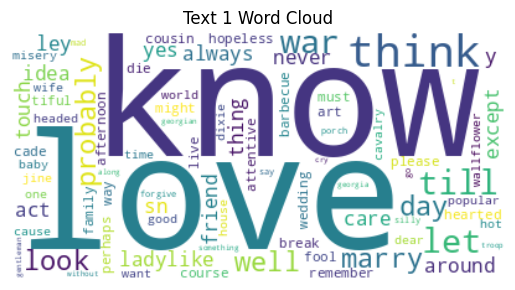

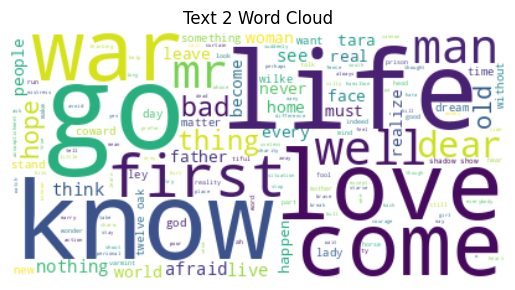

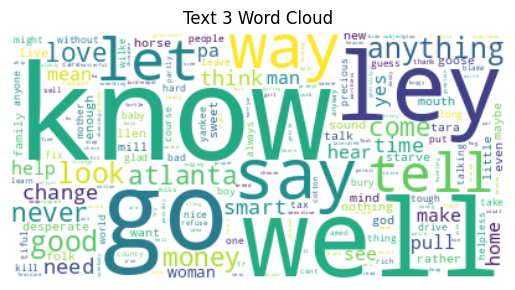

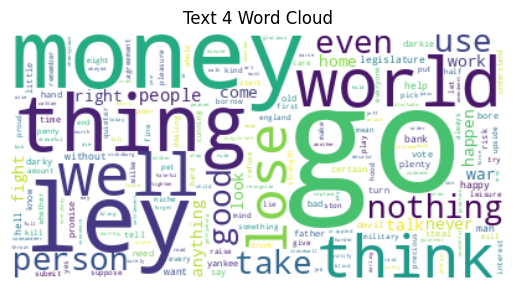

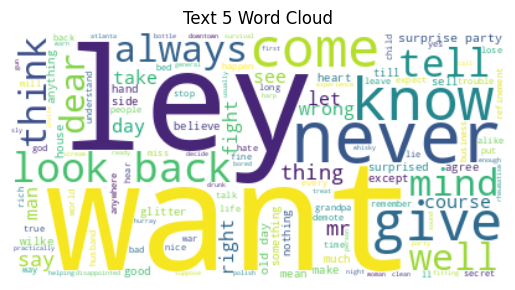

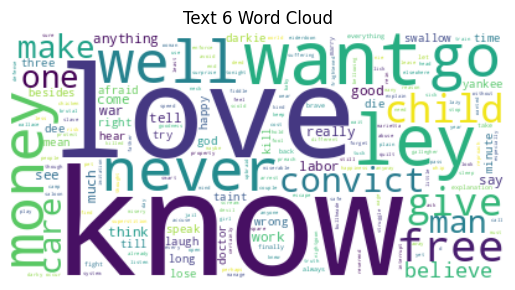

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Ashley['text_out_processed'].apply(lambda x: x.split())

# Iterate through each text and apply LDA
for idx, text in enumerate(texts):
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    topic_words = []
    for topic_id, topic in topics:
        topic_words.extend([word for word, _ in topic])

    # Generate word cloud for the text
    wordcloud = WordCloud(background_color='white').generate(' '.join(text))
    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Text {idx + 1} Word Cloud')
    plt.axis('off')
    plt.show()

Rhett_Scarlett

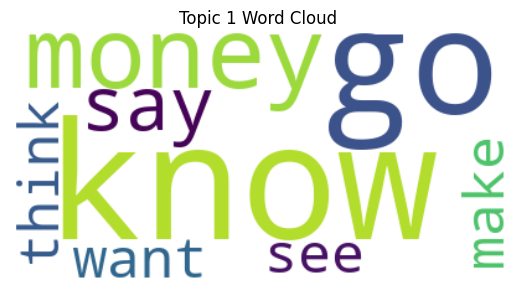

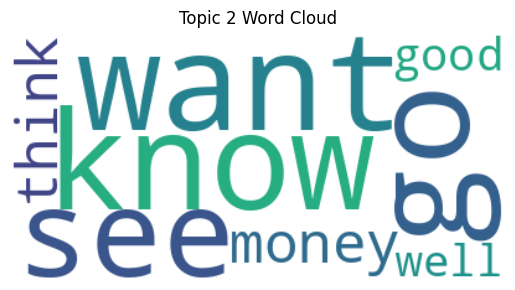

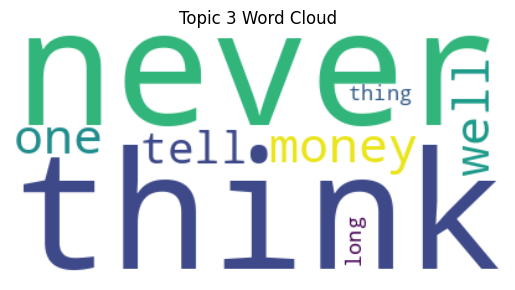

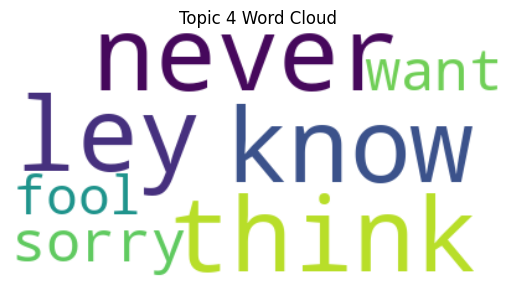

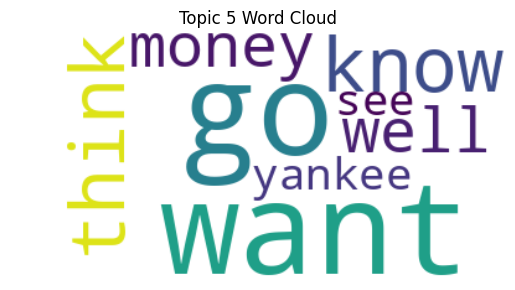

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all preprocessed texts into a single corpus
corpus = [text.split() for text in combined_df_Rhett['text_out_processed']]
texts_concatenated = [word for sublist in corpus for word in sublist]

# Create a dictionary and a bag-of-words corpus
dictionary = Dictionary(corpus)
bow_corpus = [dictionary.doc2bow(text) for text in corpus]

# Train the LDA model
num_topics = 5
ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Get the topics
topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

# Generate word clouds for each topic
for topic_id, topic in topics:
    topic_words = ' '.join([word for word, _ in topic])
    wordcloud = WordCloud(background_color='white').generate(topic_words)

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_id + 1} Word Cloud')
    plt.axis('off')
    plt.show()

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Rhett['text_out_processed'].apply(lambda x: x.split())

all_topics = []

# Iterate through each row and apply LDA
for text in texts:
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    text_topics = []
    for topic_id, topic in topics:
        text_topics.append([word for word, _ in topic])

    all_topics.append(text_topics)

# Print the topics for each text
for idx, topics in enumerate(all_topics):
    print(f"Text {idx + 1} Topics:")
    for topic_id, topic_words in enumerate(topics):
        print(f"Topic {topic_id + 1}: {topic_words}")

# Visualize topics using PyLDAvis
!pip install pyldavis==3.2.1
# First, install or upgrade PyLDAvis and Gensim
!pip install --upgrade pyldavis gensim

# Then, import and use PyLDAvis
import pyLDAvis.gensim
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

# Prepare visualization
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text 1 Topics:
Topic 1: ['never', 'think', 'long', 'like', 'get', 'money', 'tell', 'one', 'thing', 'bonnet']
Topic 2: ['get', 'money', 'think', 'well', 'one', 'war', 'never', 'like', 'tell', 'must']
Topic 3: ['get', 'like', 'never', 'would', 'money', 'think', 'bonnet', 'give', 'war', 'england']
Topic 4: ['think', 'money', 'get', 'thing', 'like', 'never', 'bonnet', 'one', 'long', 'well']
Topic 5: ['get', 'think', 'money', 'never', 'one', 'like', 'well', 'thing', 'war', 'bonnet']
Text 2 Topics:
Topic 1: ['go', 'home', 'get', 'yankee', 'would', 'road', 'take', 'let', 'see', 'like']
Topic 2: ['go', 'yankee', 'get', 'home', 'would', 'man', 'good', 'think', 'road', 'see']
Topic 3: ['go', 'get', 'yankee', 'home', 'road', 'would', 'good', 'well', 'think', 'come']
Topic 4: ['go', 'yankee', 'home', 'get', 'would', 'think', 'man', 'good', 'come', 'let']
Topic 5: ['go', 'yankee', 'home', 'get', 'would', 'man', 'think', 'like', 'let', 'even']
Text 3 Topics:
Topic 1: ['go', 'get', 'money', 'want', '

  Using cached pyLDAvis-3.4.1-py3-none-any.whl (2.6 MB)
  Attempting uninstall: pyldavis
    Found existing installation: pyLDAvis 3.2.1
    Uninstalling pyLDAvis-3.2.1:
      Successfully uninstalled pyLDAvis-3.2.1


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.062575 -0.069080       1        1  73.664762
2     -0.092006  0.071124       2        1  21.646324
4      0.007723 -0.036056       3        1   4.687629
3      0.071982  0.016266       4        1   0.000913
0      0.074876  0.017746       5        1   0.000372, topic_info=       Term        Freq       Total Category  logprob  loglift
242    know   83.000000   83.000000  Default  30.0000  30.0000
388     say   47.000000   47.000000  Default  29.0000  29.0000
192      go  104.000000  104.000000  Default  28.0000  28.0000
445    tell   47.000000   47.000000  Default  27.0000  27.0000
479    want   69.000000   69.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
455    time    0.000014   23.089836   Topic5  -7.5212  -1.8164
269     man    0.000014   36.544606   Topic5  -7.5213  -2.2757
238    keep    0.000014   20.297861   Topic5  -7.5214  -1.6877
276  matter    0.000014   16.422555   Topic5  -7.5217  -1.4761
191    give    0.000014   27.339239   Topic5  -7.5223  -1.9865

[385 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
22        1  0.715525  anything
22        2  0.214658  anything
22        3  0.071553  anything
524       1  0.963329      army
527       1  1.012610   atlanta
...     ...       ...       ...
508       2  0.478253      year
508       3  0.068322      year
1215      1  0.732345       yee
509       1  0.869551       yes
509       2  0.119938       yes

[343 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 5, 4, 1])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


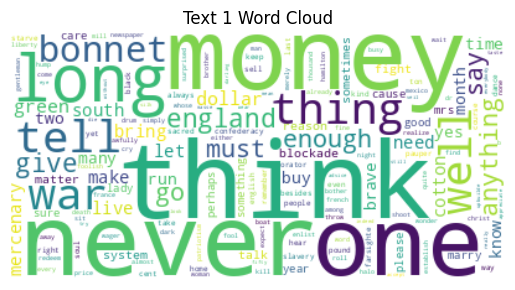

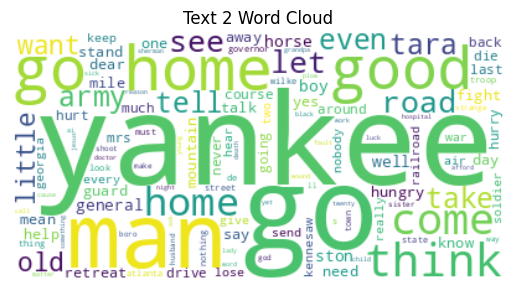

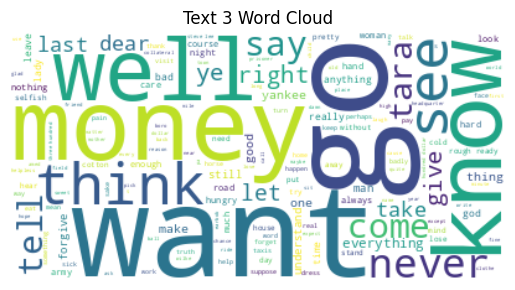

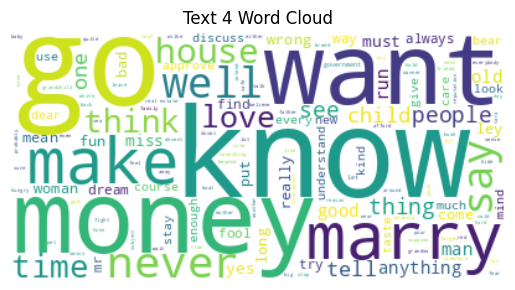

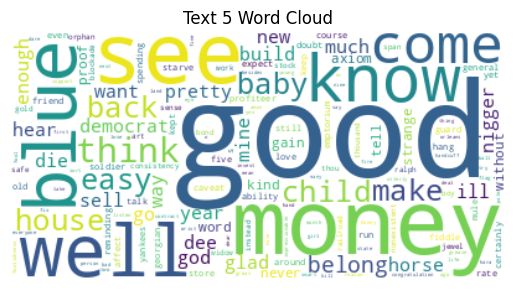

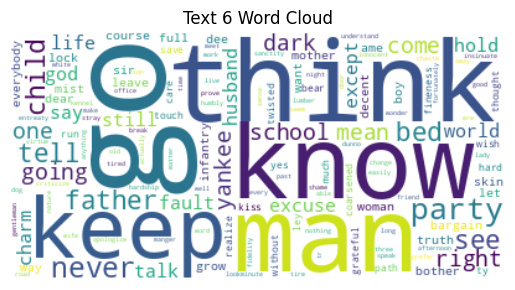

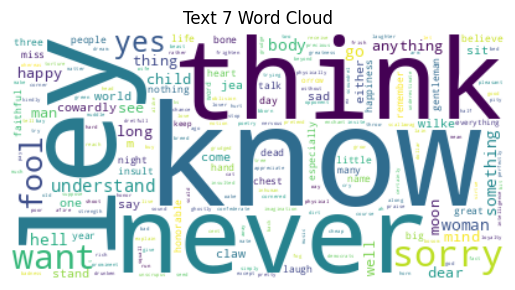

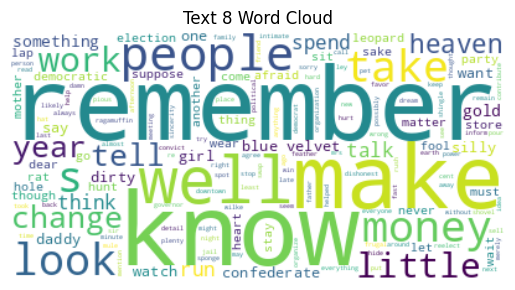

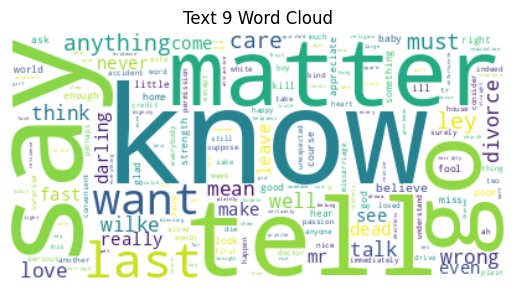

In [ ]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named combined_df_Melanie with 'text_out_processed' column
texts = combined_df_Rhett['text_out_processed'].apply(lambda x: x.split())

# Iterate through each text and apply LDA
for idx, text in enumerate(texts):
    # Create a dictionary from the preprocessed data
    dictionary = Dictionary([text])

    # Convert the preprocessed text data into bag-of-words format
    bow_corpus = [dictionary.doc2bow(text)]

    # Train the LDA model
    num_topics = 5
    ldamodel = LdaModel(bow_corpus, num_topics=num_topics, id2word=dictionary, passes=20, alpha='auto', eta='auto')

    # Get the topics
    topics = ldamodel.show_topics(num_topics=num_topics, num_words=10, log=False, formatted=False)

    # Extract top words for each topic
    topic_words = []
    for topic_id, topic in topics:
        topic_words.extend([word for word, _ in topic])

    # Generate word cloud for the text
    wordcloud = WordCloud(background_color='white').generate(' '.join(text))
    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Text {idx + 1} Word Cloud')
    plt.axis('off')
    plt.show()